# Analysis to select the best parameters (number of bins in the histogram and bases)

In [ ]:
!pip install matplotlib-venn
!pip install numpy
!pip install scipy
!pip install pandas

In [ ]:
import numpy as np
import main
from matplotlib import pyplot as plt
from scipy.optimize import curve_fit
import pandas as pd

# Fitting function given in "Methods of data reduction"

In [ ]:
def log_fit_function(n, *pars, a):
    t_0 = 1
    a0, tau = pars
    return a0 * (np.exp(-(t_0 * np.power(a, n) / tau)) - np.exp(-(t_0 * np.power(a, n + 1) / tau)))

# Data generating function (imported from toymodel main file)

In [ ]:
def generating_data(t, n):
    model = main.ToyModel('215Th')
    global decay_times
    decay_times = [round(model.timemoment_of_decay(t), 6) for _ in range(n)]
    decay_times = [el for el in decay_times if el != 0]

# A function that performs a fit and returns only the result of the fit

In [ ]:
def log_fitting(n_b, a):
    decay_log_times = [np.log(el) / np.log(a) for el in decay_times]
    counts_log, log_time_bins_edges, _ = plt.hist(decay_log_times, bins=num_of_bins)
    log_time_bins = [(log_time_bins_edges[i] + log_time_bins_edges[i + 1]) / 2 for i in range(len(log_time_bins_edges) - 1)]
    popt, pocv = curve_fit(lambda n, *pars, a=a: log_fit_function(n, *pars, a=a), log_time_bins, counts_log, p0=[100, 3])
    errs = np.sqrt(np.diag(pocv))
    return popt[1] * np.log(2), errs[1] * np.log(2)

# A function that performs all the proccess (generate data and fit it) using defined parameters
As parameters we have:
1. Number of events
2. Base for the fit function from "Methods of data reduction"
3. Number of bins in histogram
4. Half-life time (is used for genetating data

In [ ]:
def full_cycle(num_of_decays, a, num_of_bins, hlt):
    generating_data(hlt, num_of_decays)
    # exp_fit_results = exp_fitting(num_of_bins)
    log_fit_results = log_fitting(num_of_bins, a)
    return log_fit_results

# A small step to the side that shows that fit is good enough (unlike the previous versions)

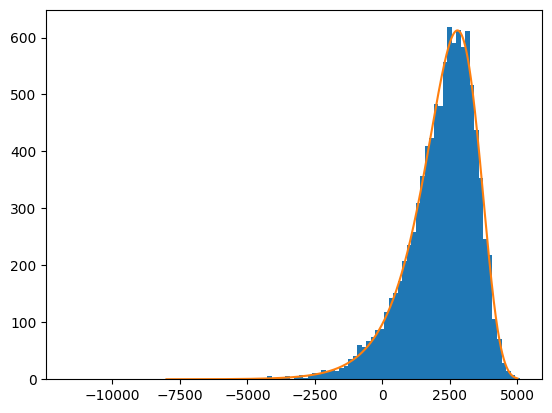

In [ ]:
def log_fitting_2(n_b, a):
    decay_log_times = [np.log(el) / np.log(a) for el in decay_times]
    counts_log, log_time_bins_edges, _ = plt.hist(decay_log_times, bins=100)
    log_time_bins = [(log_time_bins_edges[i] + log_time_bins_edges[i + 1]) / 2 for i in range(len(log_time_bins_edges) - 1)]
    popt, pocv = curve_fit(lambda n, *pars, a=a: log_fit_function(n, *pars, a=a), log_time_bins, counts_log, p0=[100, 3])
    errs = np.sqrt(np.diag(pocv))
    return popt

generating_data(11.2, 10000)
pars = log_fitting_2(90, 1.001)
n_list = np.linspace(-8000, 5000, 10000)
plt.plot(n_list, [log_fit_function(n, *pars, a=1.001) for n in n_list])

# Generating data with different combinations of parameters for looking for some dependencies

<ipython-input-8-1d90fd59bebc>:6: RuntimeWarning: overflow encountered in exp
  return a0 * (np.exp(-(t_0 * np.power(a, n) / tau)) - np.exp(-(t_0 * np.power(a, n + 1) / tau)))
<ipython-input-8-1d90fd59bebc>:6: RuntimeWarning: invalid value encountered in subtract
  return a0 * (np.exp(-(t_0 * np.power(a, n) / tau)) - np.exp(-(t_0 * np.power(a, n + 1) / tau)))
<ipython-input-8-1d90fd59bebc>:6: RuntimeWarning: overflow encountered in multiply
  return a0 * (np.exp(-(t_0 * np.power(a, n) / tau)) - np.exp(-(t_0 * np.power(a, n + 1) / tau)))
<ipython-input-8-1d90fd59bebc>:6: RuntimeWarning: overflow encountered in exp
  return a0 * (np.exp(-(t_0 * np.power(a, n) / tau)) - np.exp(-(t_0 * np.power(a, n + 1) / tau)))
<ipython-input-8-1d90fd59bebc>:6: RuntimeWarning: invalid value encountered in subtract
  return a0 * (np.exp(-(t_0 * np.power(a, n) / tau)) - np.exp(-(t_0 * np.power(a, n + 1) / tau)))
<ipython-input-8-1d90fd59bebc>:6: RuntimeWarning: overflow encountered in multiply
  return a0 

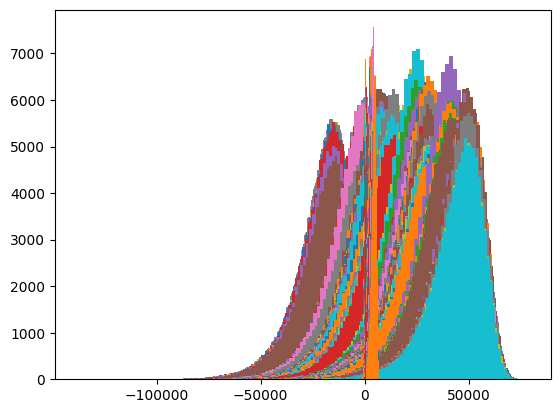

In [ ]:
half_life_time_list =  [0.157, 0.678, 1.34, 1.54, 2.7, 8.5, 9.73, 14.83, 15.38, 42, 43.75, 98.71, 101.63]
n_decays_list = [100, 1000, 10000, 100000]

results_df = pd.DataFrame(columns=['hlt', 'num_of_decays', 'a', 'n_bins', 'obtained_hlt', 'hlt_error'])
for half_life_time in half_life_time_list:
    for n_decays in n_decays_list:
        for a in [1.0001, 1.001, 1.01, 1.1]:
            for n_b in list(range(10, 201, 10)) + list(range(225, 501, 25)):
                fitting_results = full_cycle(n_decays, a, n_b, half_life_time)
                # if half_life_time > results[0] - results[1] and half_life_time < results[0] + results[1]:
                #     print(a, n_b, results)
                results_df.loc[len(results_df.index)] = [half_life_time, n_decays, a, n_b, fitting_results[0], fitting_results[1]]

results_df.to_csv('data_for_parameters_fitting.csv')

In [ ]:
df = results_df.copy()

df['delta_hlt'] = 100 * np.abs(df.obtained_hlt - df.hlt) / df.hlt

# **Let's see if we have systematic dependencies and if we can fit the number of bins and base as a function of the number of events and an approximate half-life time**

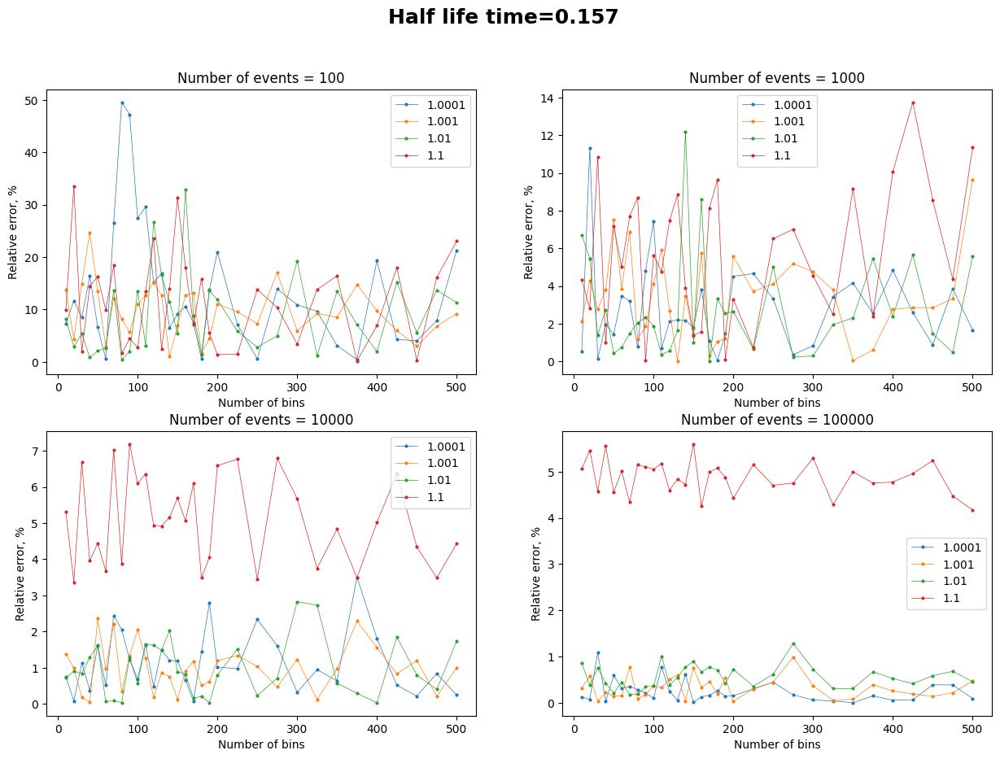

<Figure size 640x480 with 0 Axes>

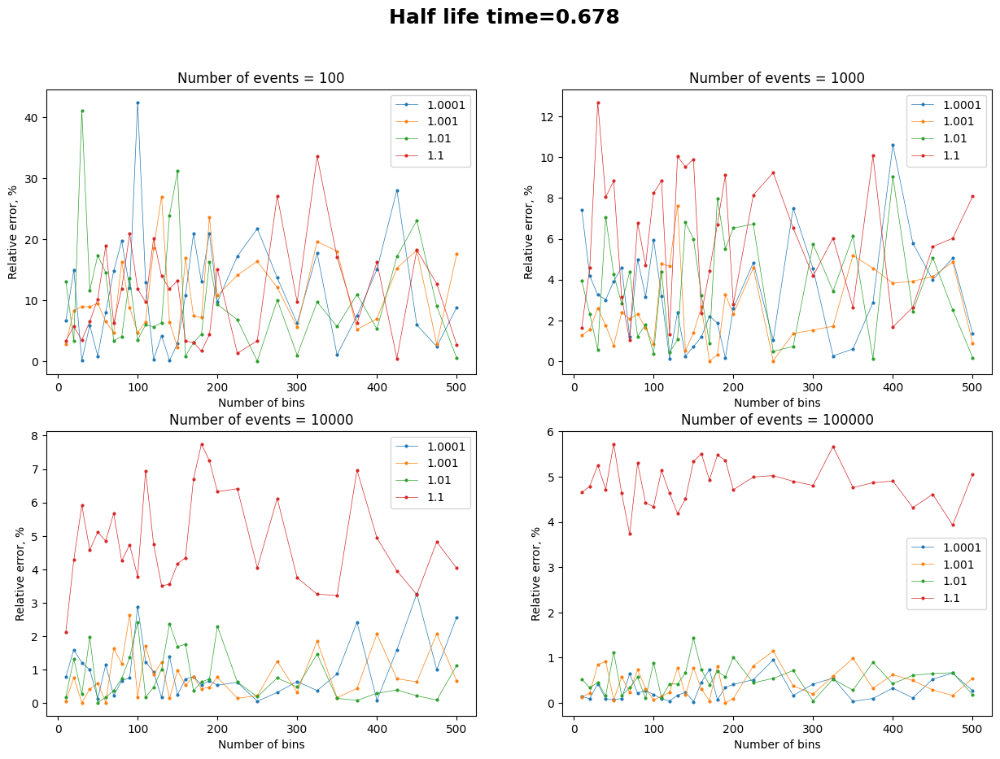

<Figure size 640x480 with 0 Axes>

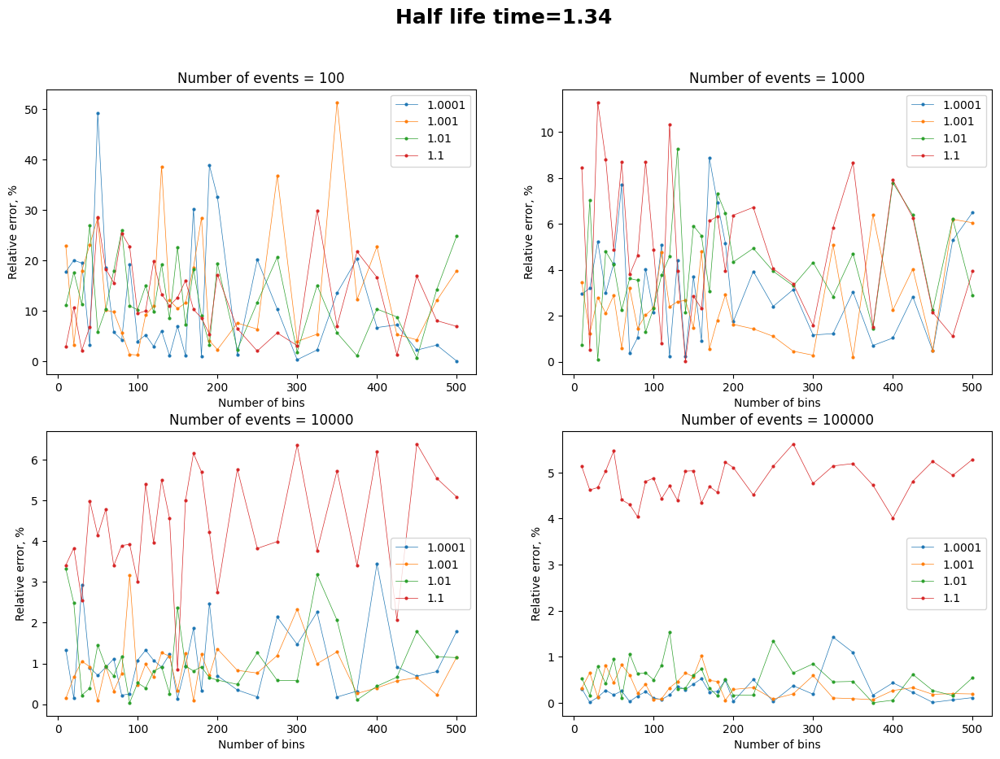

<Figure size 640x480 with 0 Axes>

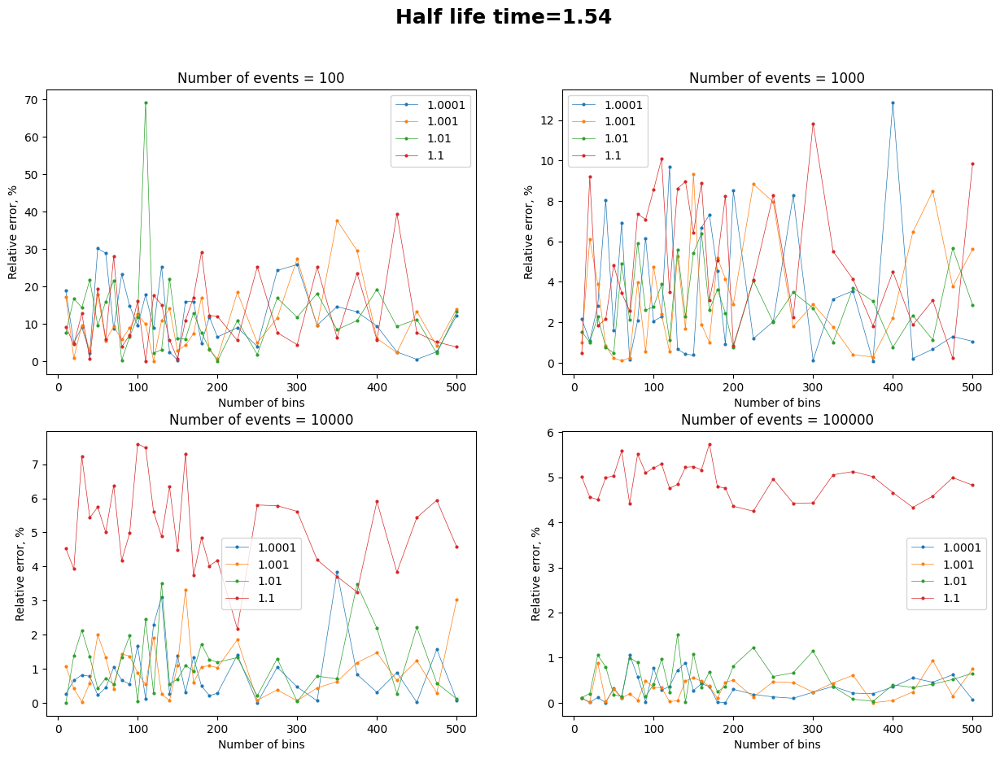

<Figure size 640x480 with 0 Axes>

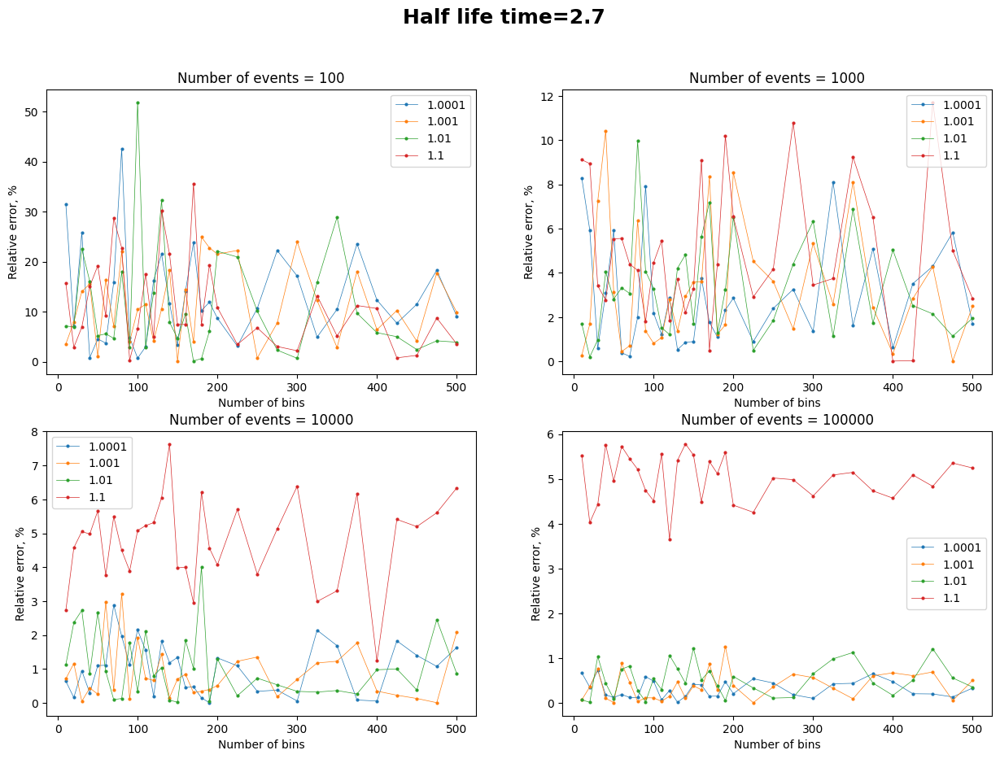

<Figure size 640x480 with 0 Axes>

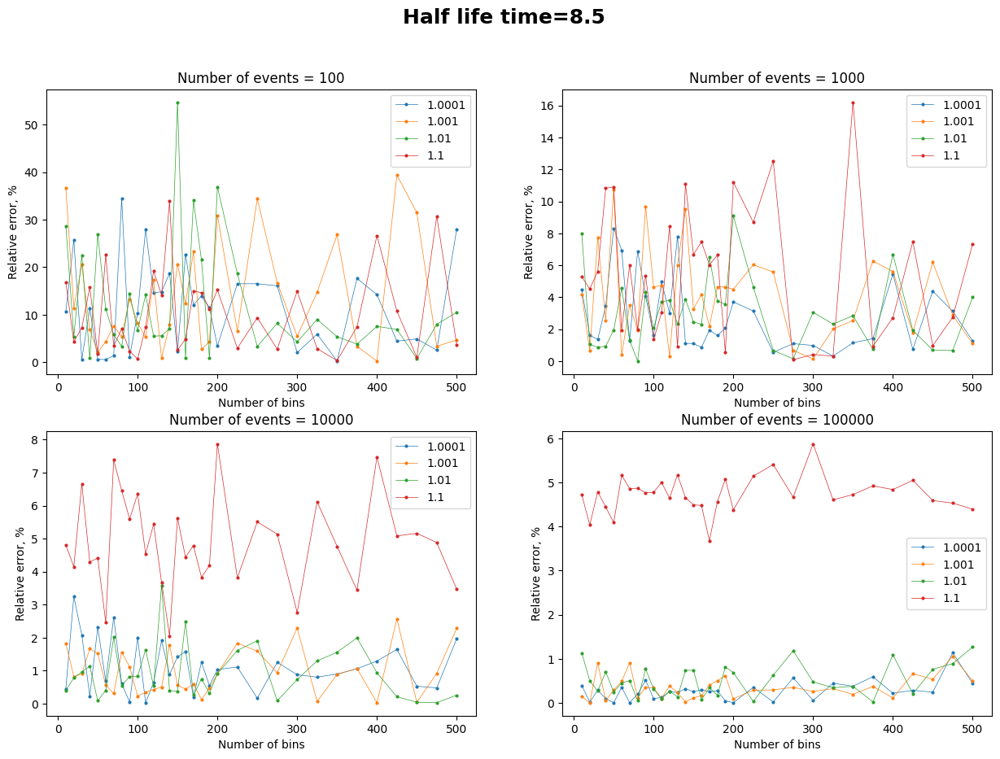

<Figure size 640x480 with 0 Axes>

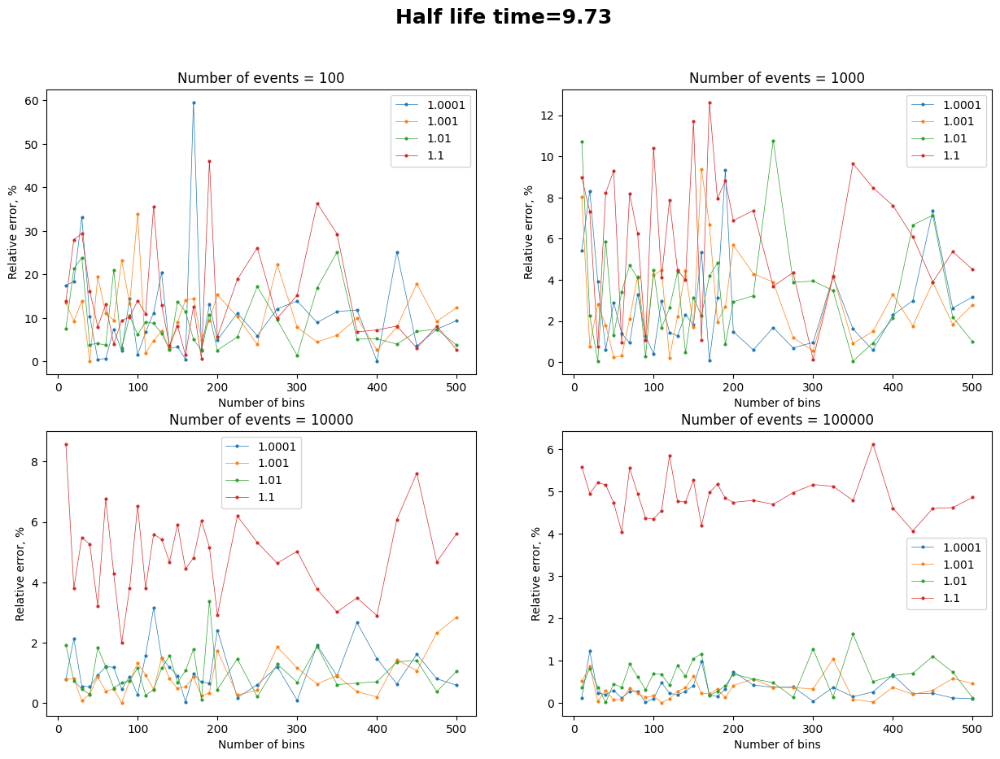

<Figure size 640x480 with 0 Axes>

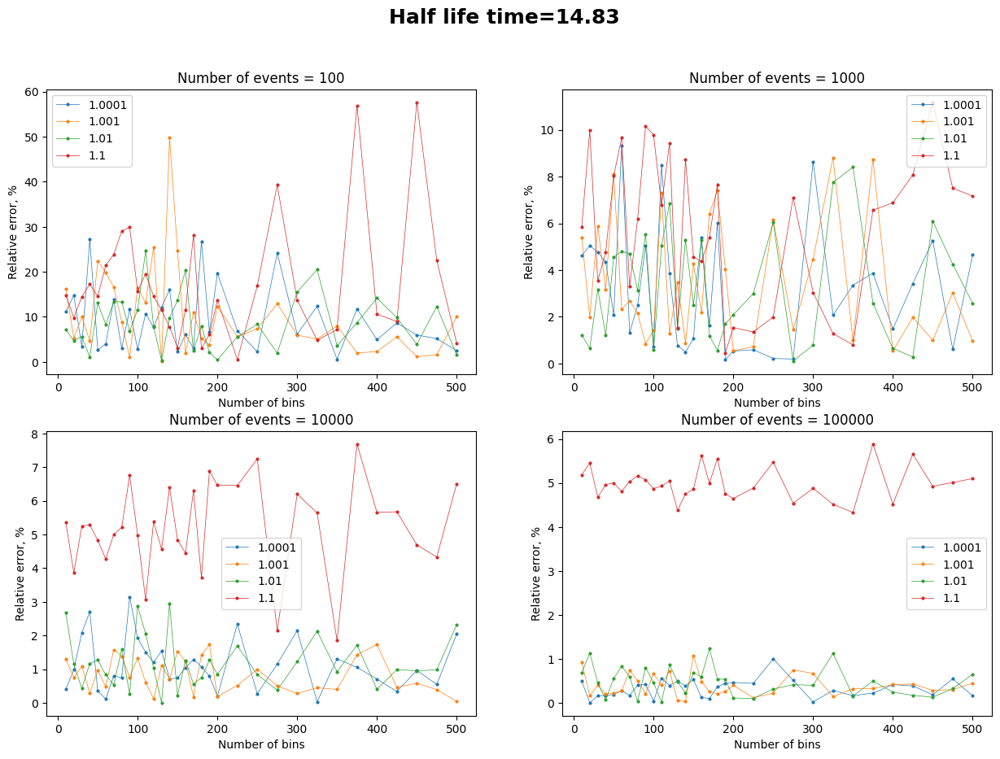

<Figure size 640x480 with 0 Axes>

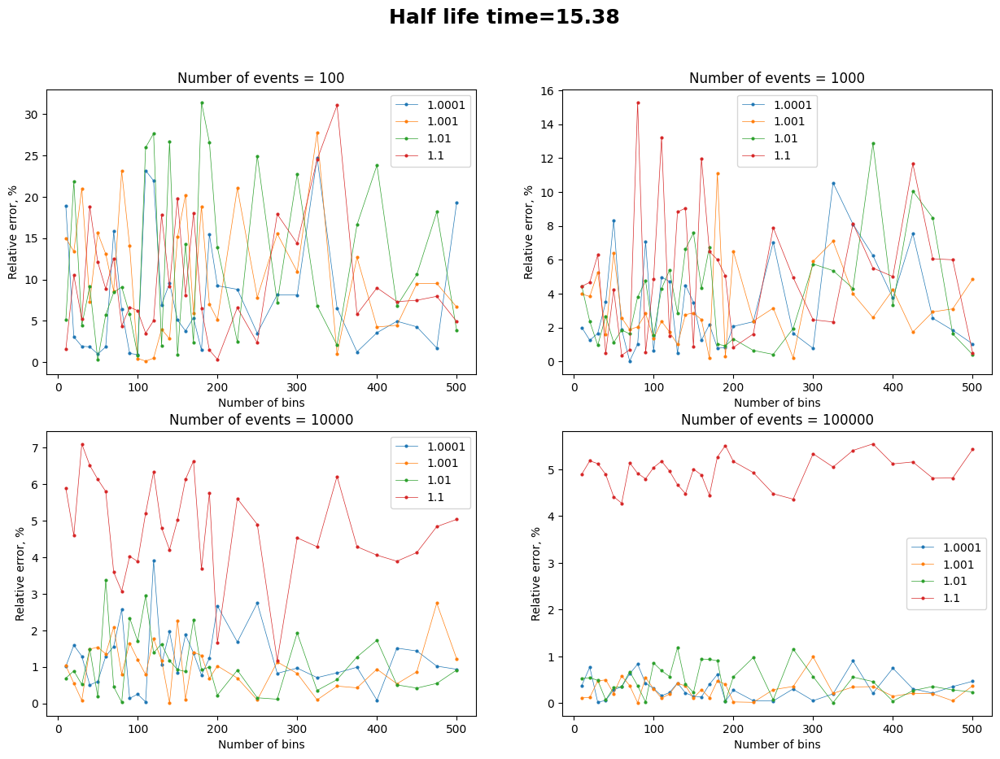

<Figure size 640x480 with 0 Axes>

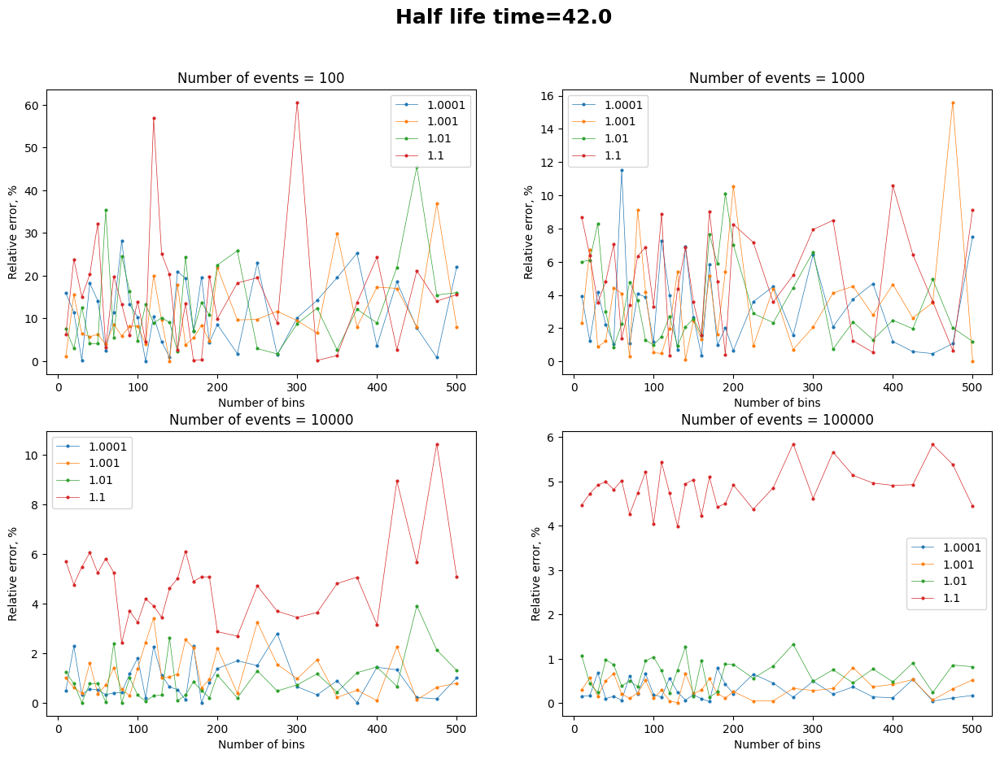

<Figure size 640x480 with 0 Axes>

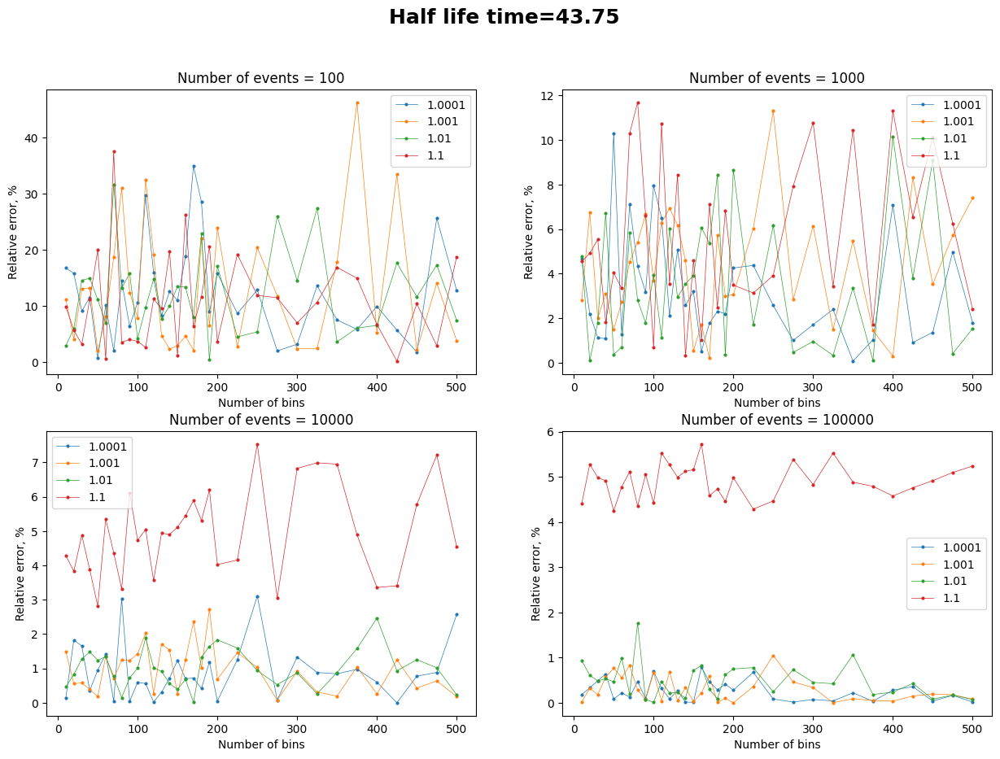

<Figure size 640x480 with 0 Axes>

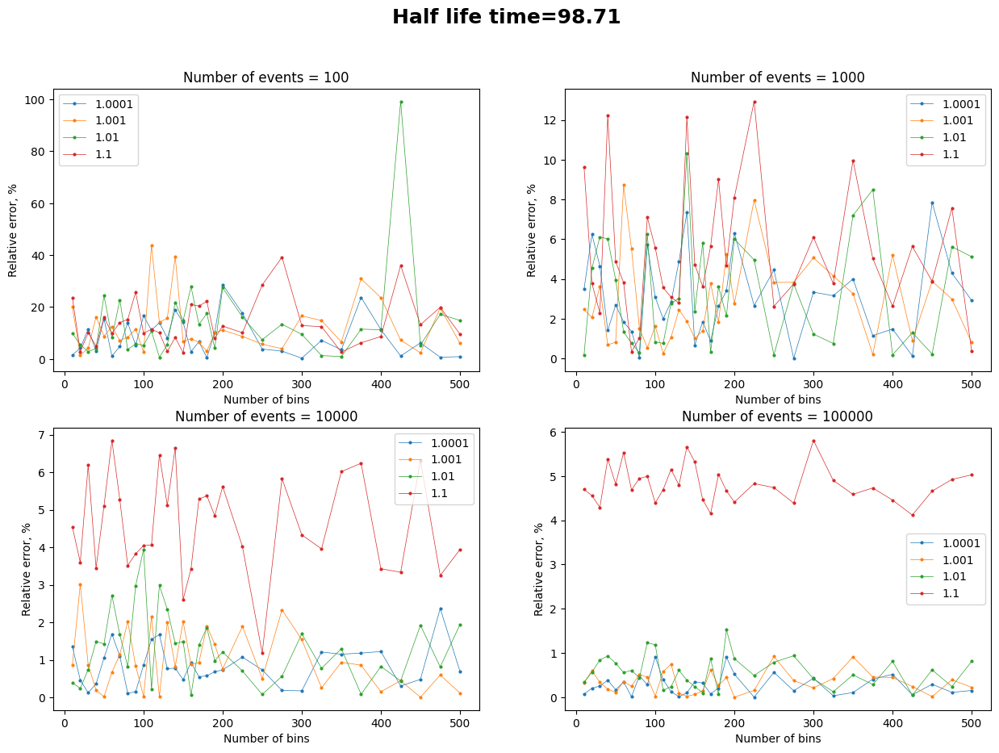

<Figure size 640x480 with 0 Axes>

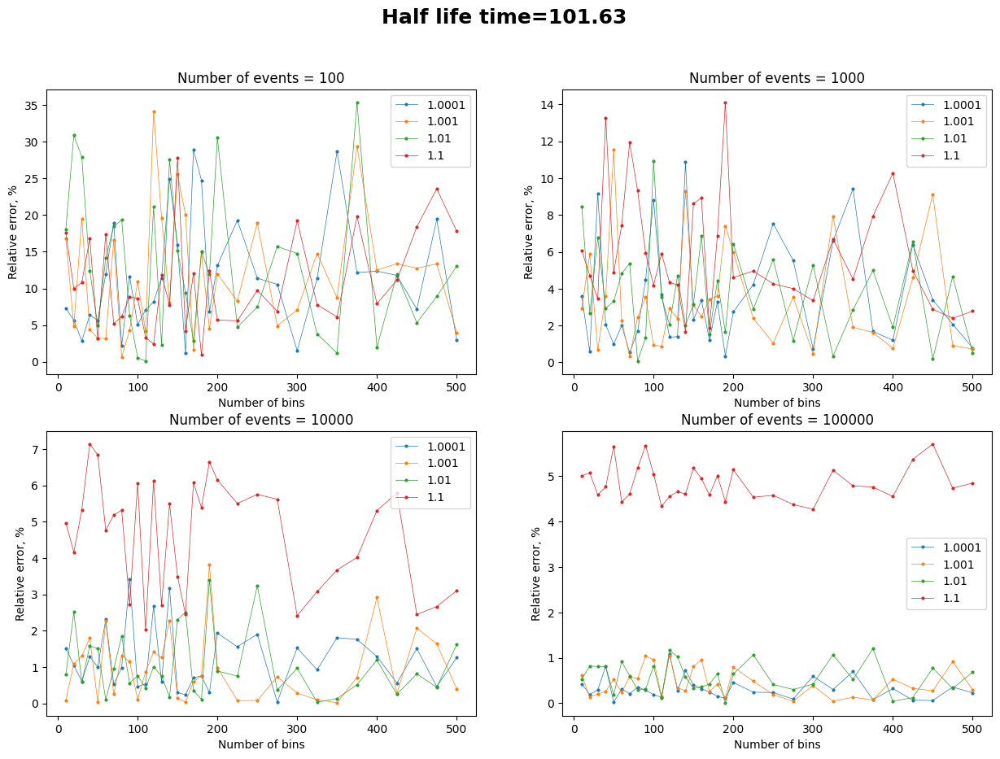

<Figure size 640x480 with 0 Axes>

In [ ]:
for hlt in df.hlt.unique():
  df_1 = df[df.hlt == hlt].copy()
  fig, ax = plt.subplots(2, 2, figsize=(15,10))
  for n_d in df_1.num_of_decays.unique():
    ind = list(df_1.num_of_decays.unique()).index(n_d)
    ind = ((0, ind) if ind < 2 else (1, ind - 2))
    for a_tmp in df_1.a.unique():
      ax[ind].plot(df_1[(df_1.num_of_decays == n_d) & (df_1.a == a_tmp)].n_bins, df_1[(df_1.num_of_decays == n_d) & (df_1.a == a_tmp)].delta_hlt, '-o', label=str(a_tmp), linewidth=0.5, ms=2)
      ax[ind].legend()
      ax[ind].set_title(f'Number of events = {int(n_d)}')
      ax[ind].set_xlabel('Number of bins')
      ax[ind].set_ylabel('Relative error, %')
  fig.suptitle(f'Half life time={hlt}', fontweight="bold", fontsize=18)
  plt.show()
  plt.clf()

# **Now it's obvious that even 1.1 is too big base (gives too big relative error)**

So, let's skip it and see what we have

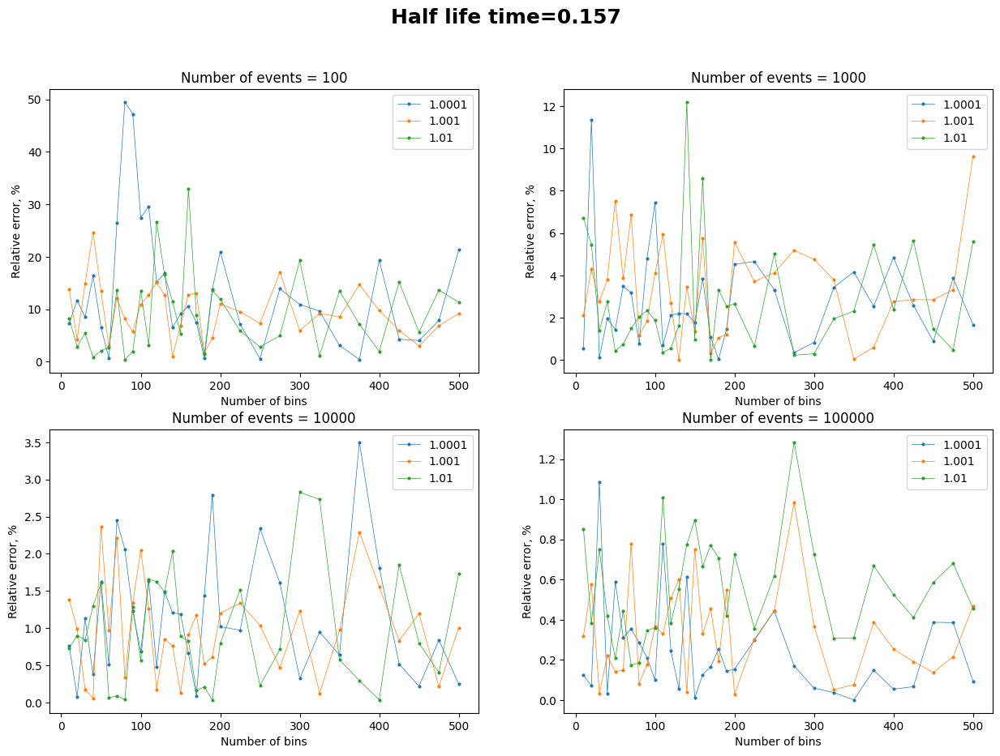

<Figure size 640x480 with 0 Axes>

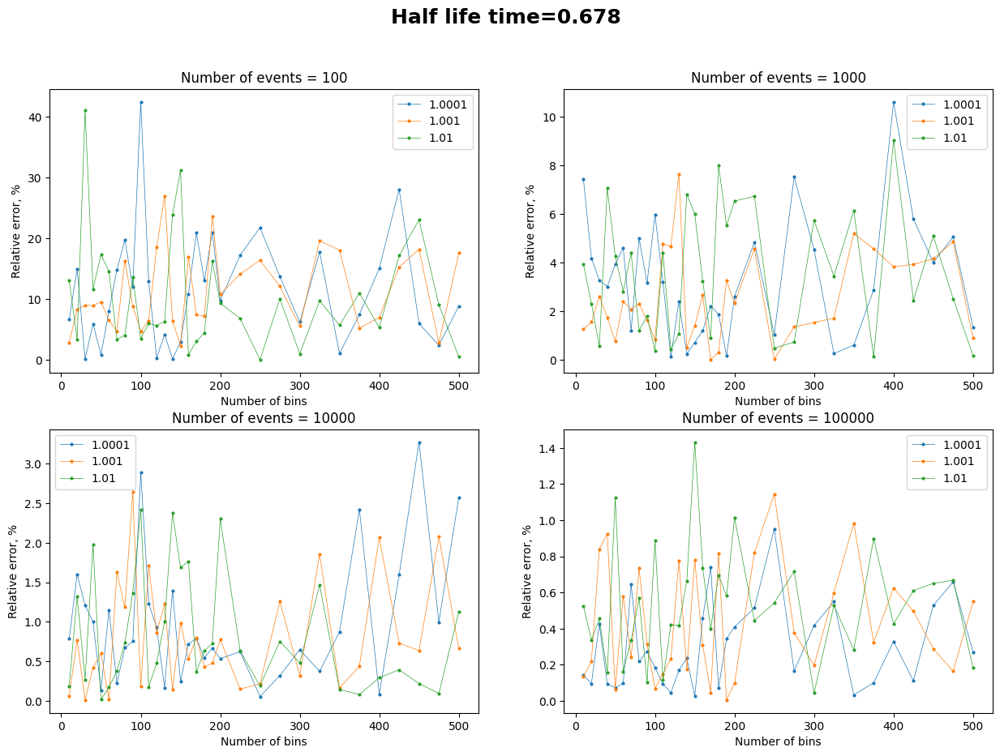

<Figure size 640x480 with 0 Axes>

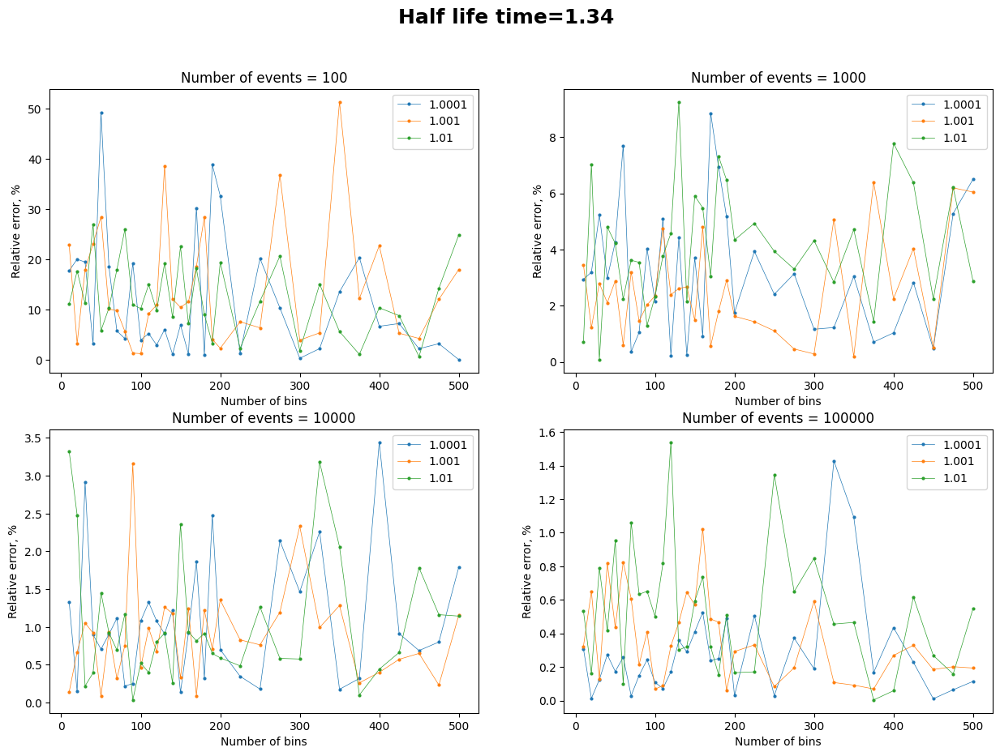

<Figure size 640x480 with 0 Axes>

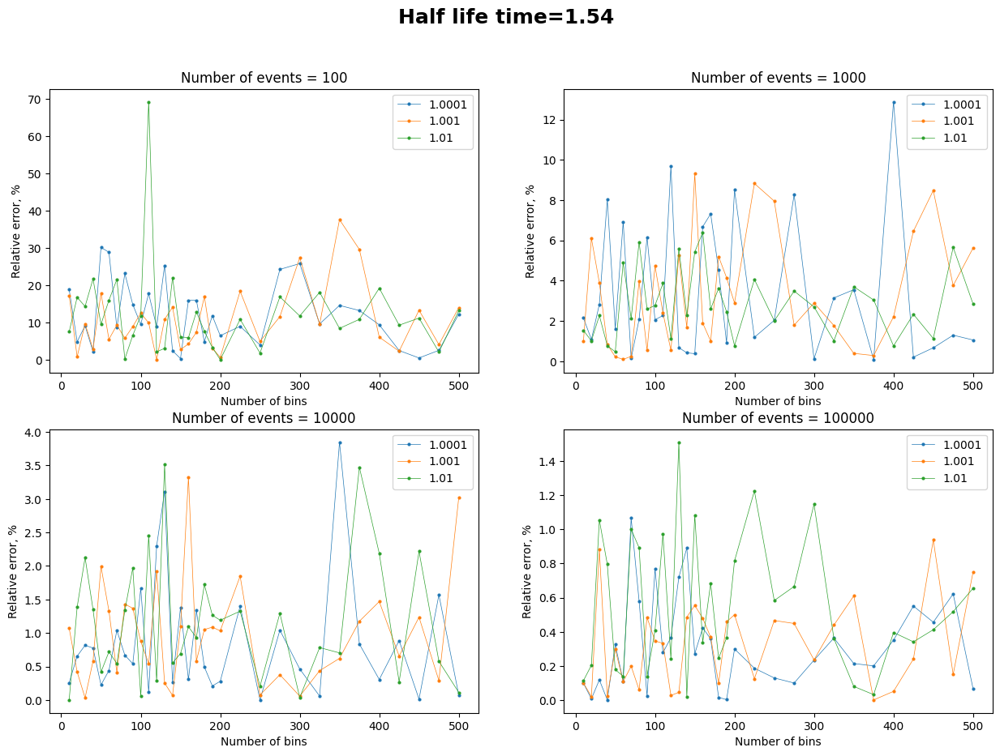

<Figure size 640x480 with 0 Axes>

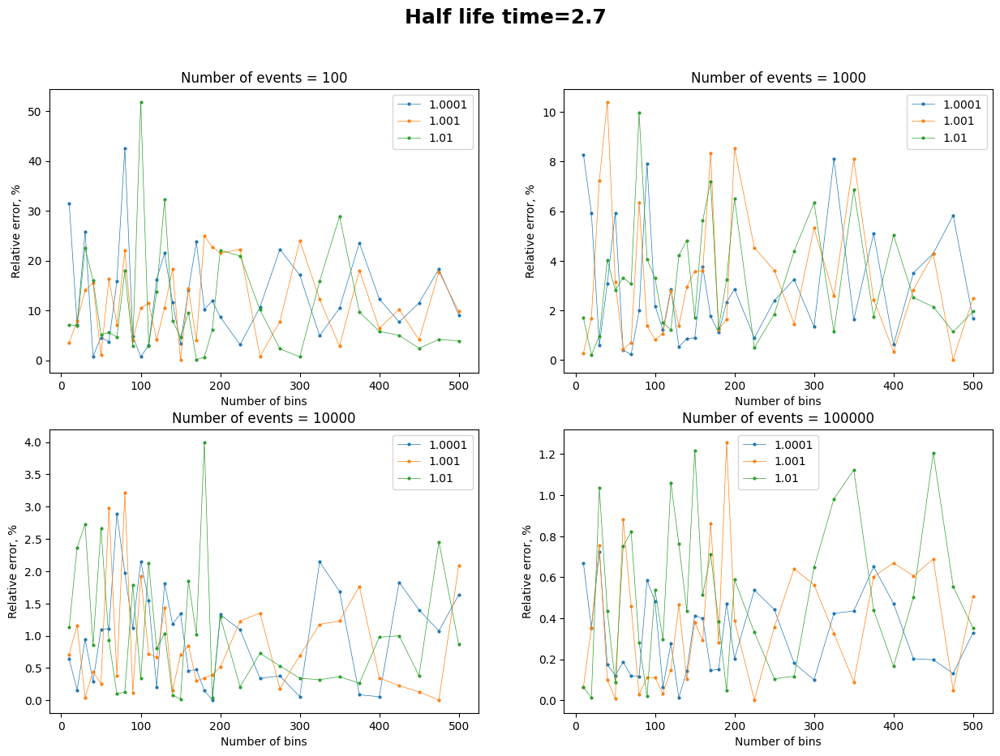

<Figure size 640x480 with 0 Axes>

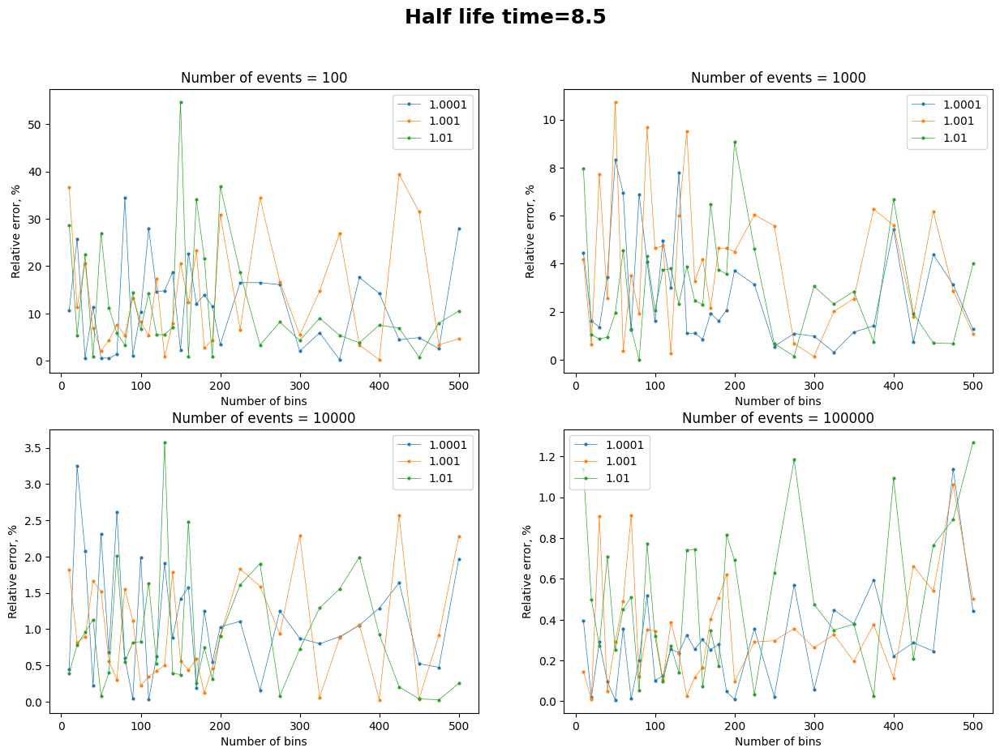

<Figure size 640x480 with 0 Axes>

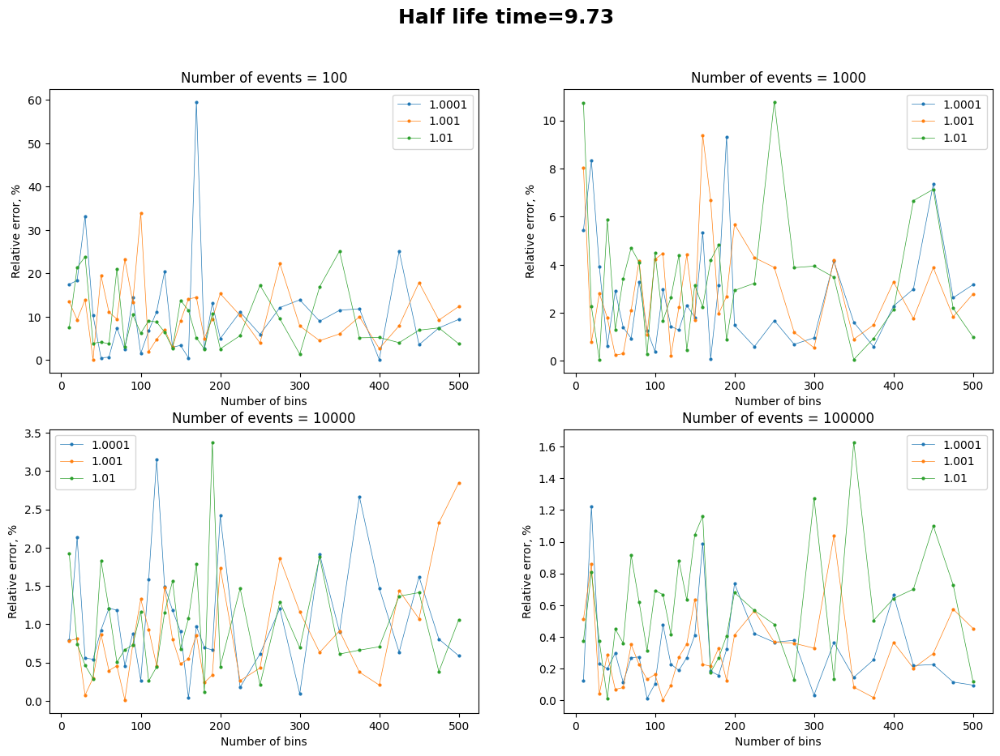

<Figure size 640x480 with 0 Axes>

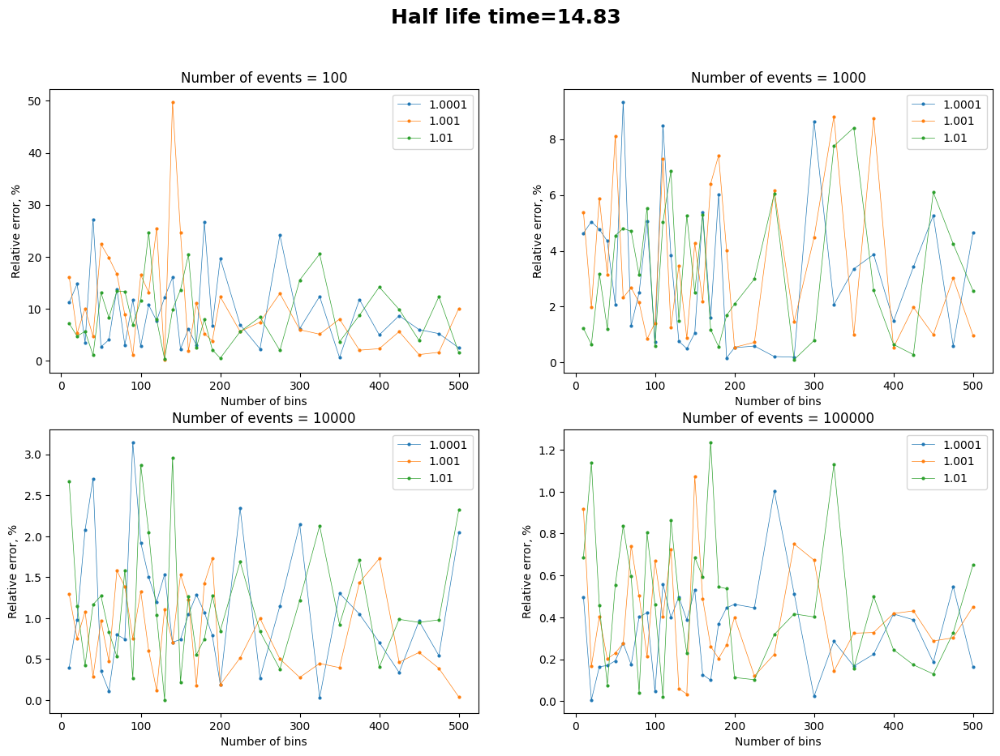

<Figure size 640x480 with 0 Axes>

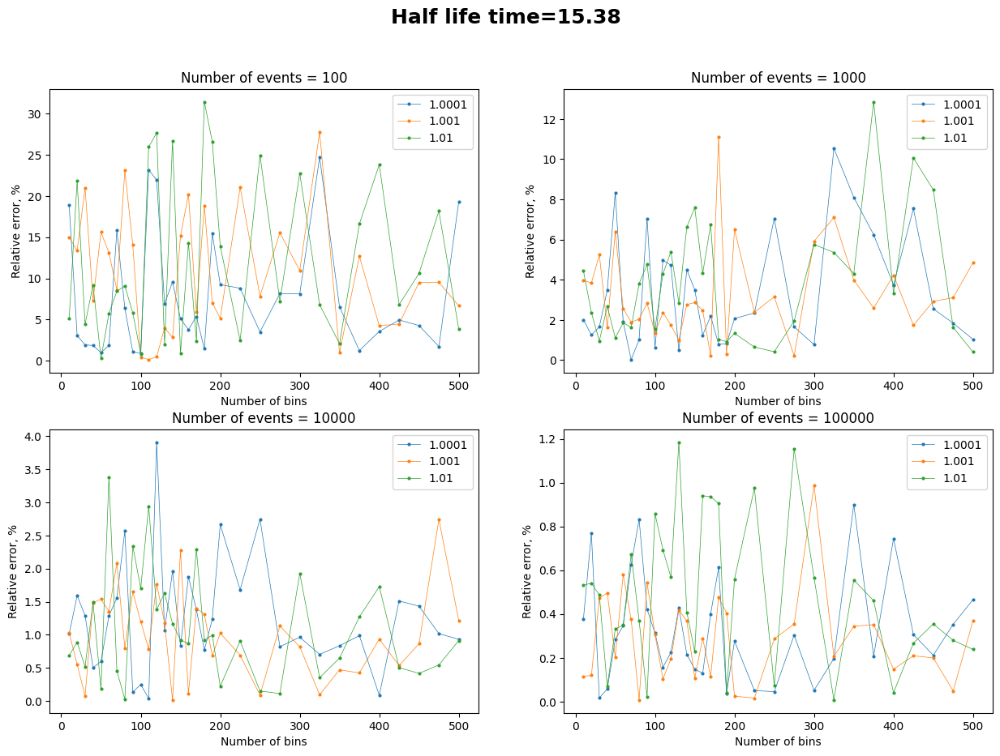

<Figure size 640x480 with 0 Axes>

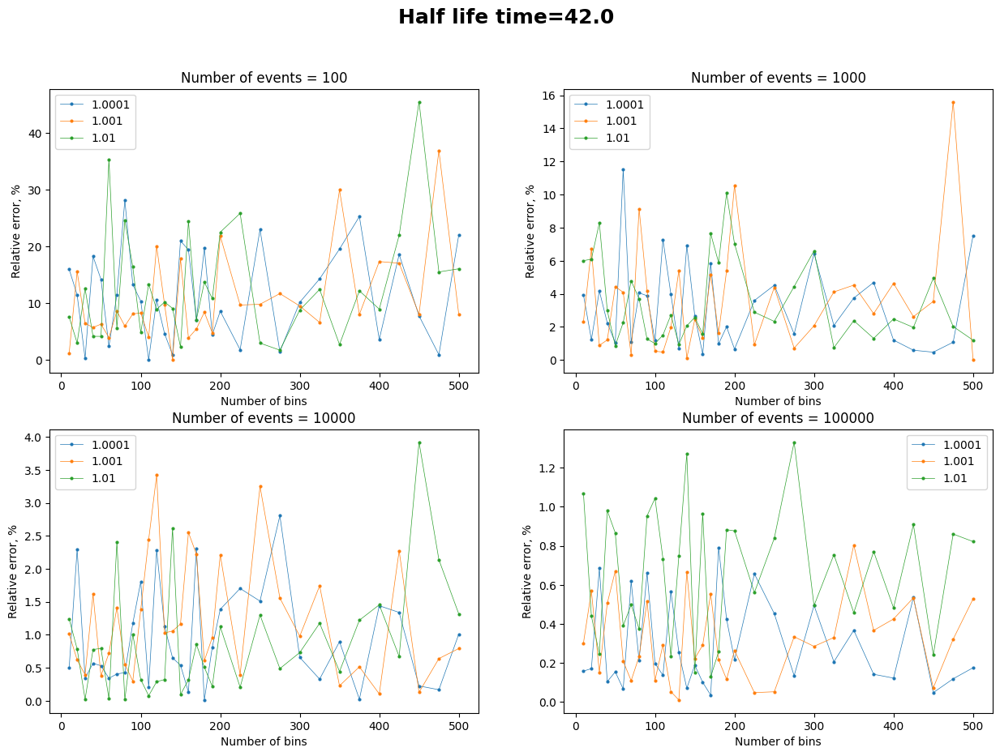

<Figure size 640x480 with 0 Axes>

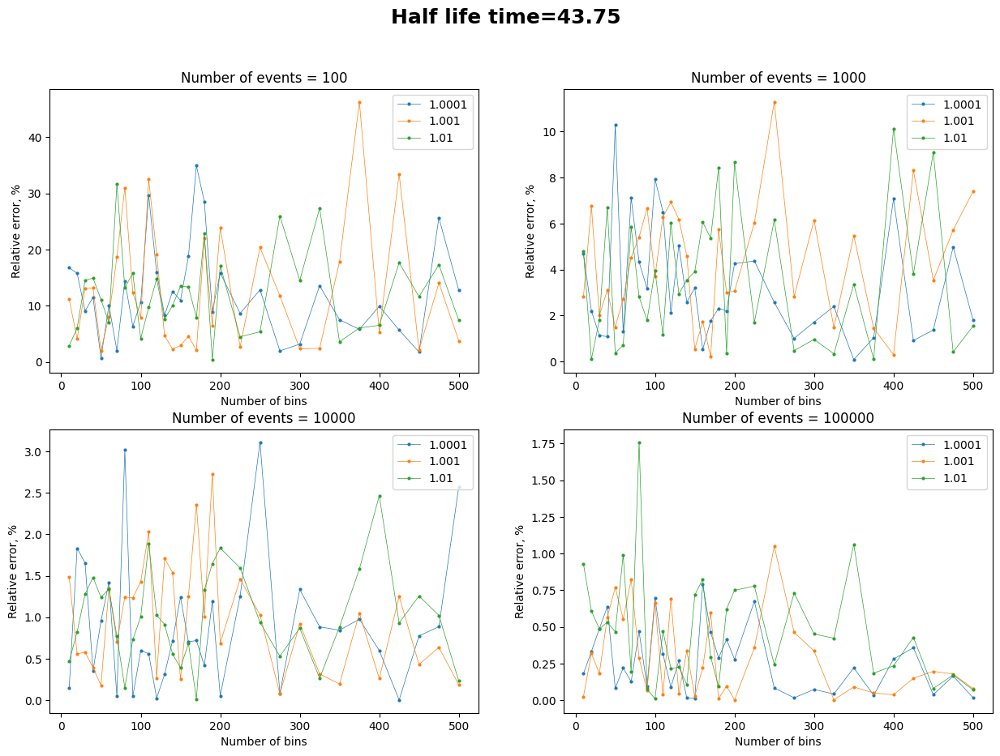

<Figure size 640x480 with 0 Axes>

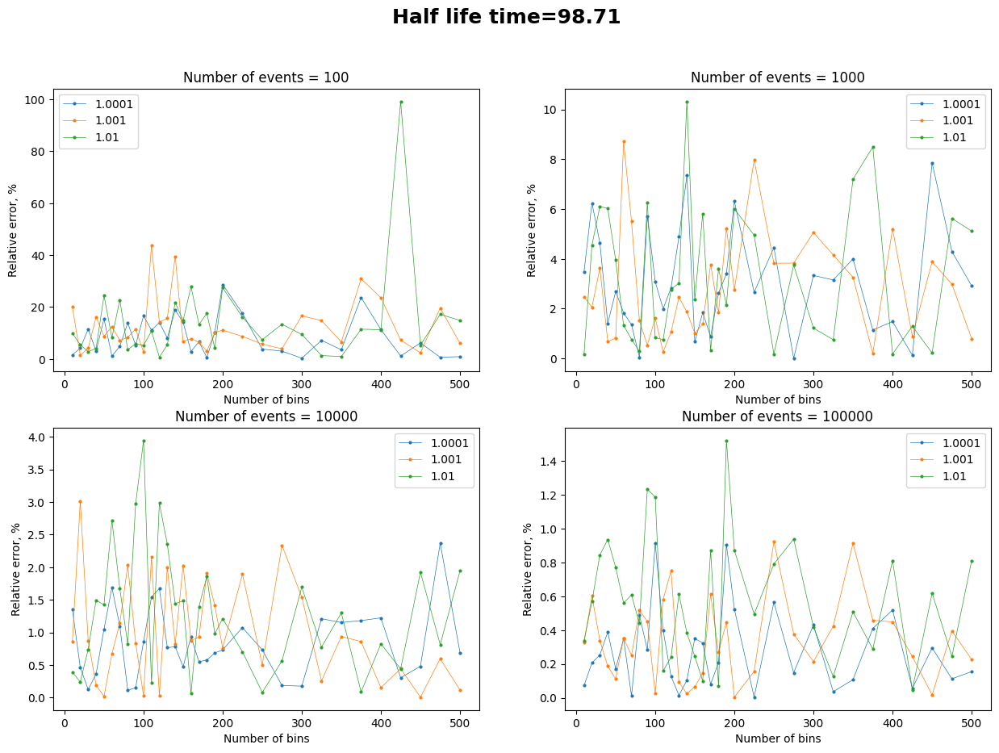

<Figure size 640x480 with 0 Axes>

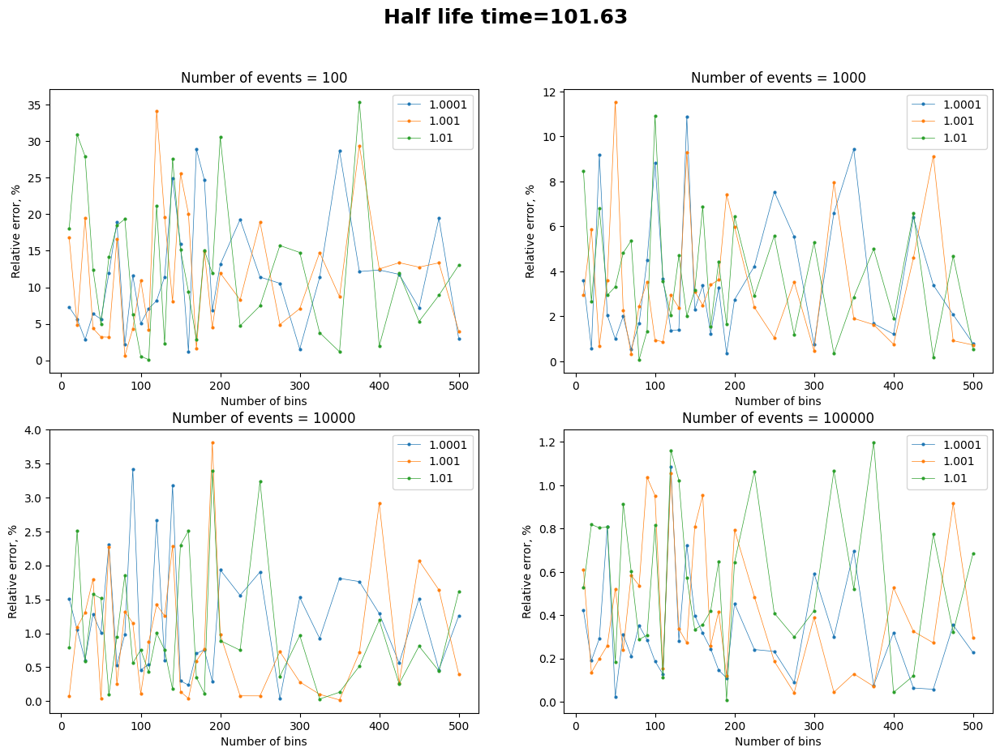

<Figure size 640x480 with 0 Axes>

In [ ]:
for hlt in df.hlt.unique():
  df_1 = df[(df.hlt == hlt) & (df.a != 1.1)].copy()
  fig, ax = plt.subplots(2, 2, figsize=(15,10))
  for n_d in df_1.num_of_decays.unique():
    ind = list(df_1.num_of_decays.unique()).index(n_d)
    ind = ((0, ind) if ind < 2 else (1, ind - 2))
    for a_tmp in df_1.a.unique():
      ax[ind].plot(df_1[(df_1.num_of_decays == n_d) & (df_1.a == a_tmp)].n_bins, df_1[(df_1.num_of_decays == n_d) & (df_1.a == a_tmp)].delta_hlt, '-o', label=str(a_tmp), linewidth=0.5, ms=2)
      ax[ind].legend()
      ax[ind].set_title(f'Number of events = {int(n_d)}')
      ax[ind].set_xlabel('Number of bins')
      ax[ind].set_ylabel('Relative error, %')
  fig.suptitle(f'Half life time={hlt}', fontweight="bold", fontsize=18)
  plt.show()
  plt.clf()

# Now we can say that the entire relative error is a kind of stochastic function of the number of bins. In any case, in my opinion base 1.01 gives the most scattered values of the relative error, so I want to discard it and use only bases 1.001 and 1.0001 for further comparison.

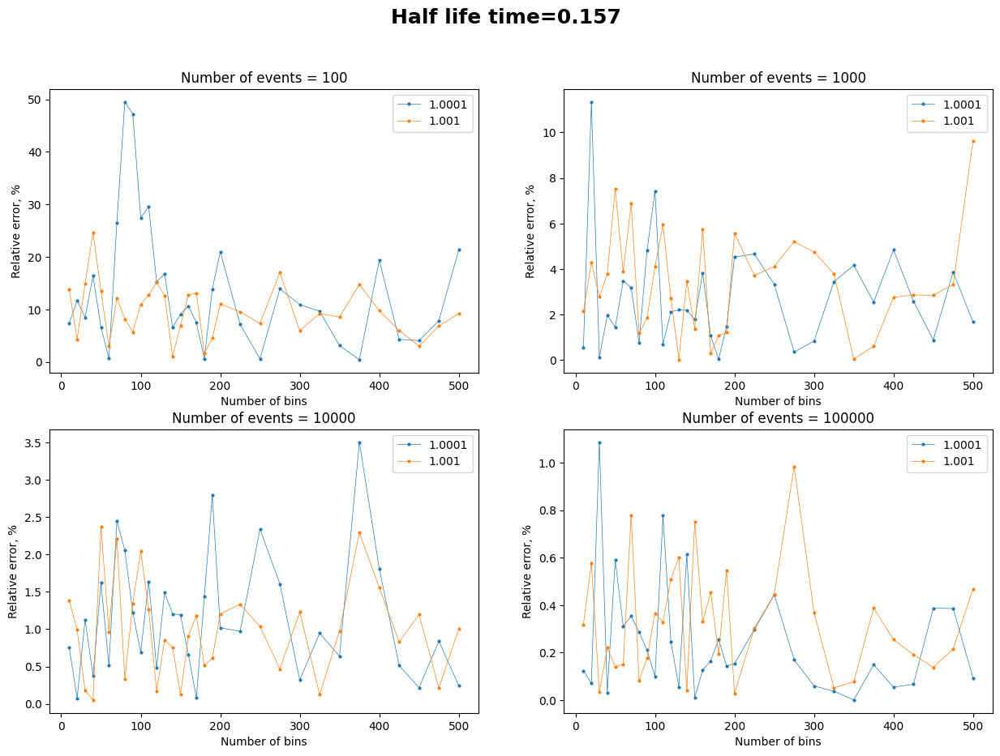

<Figure size 640x480 with 0 Axes>

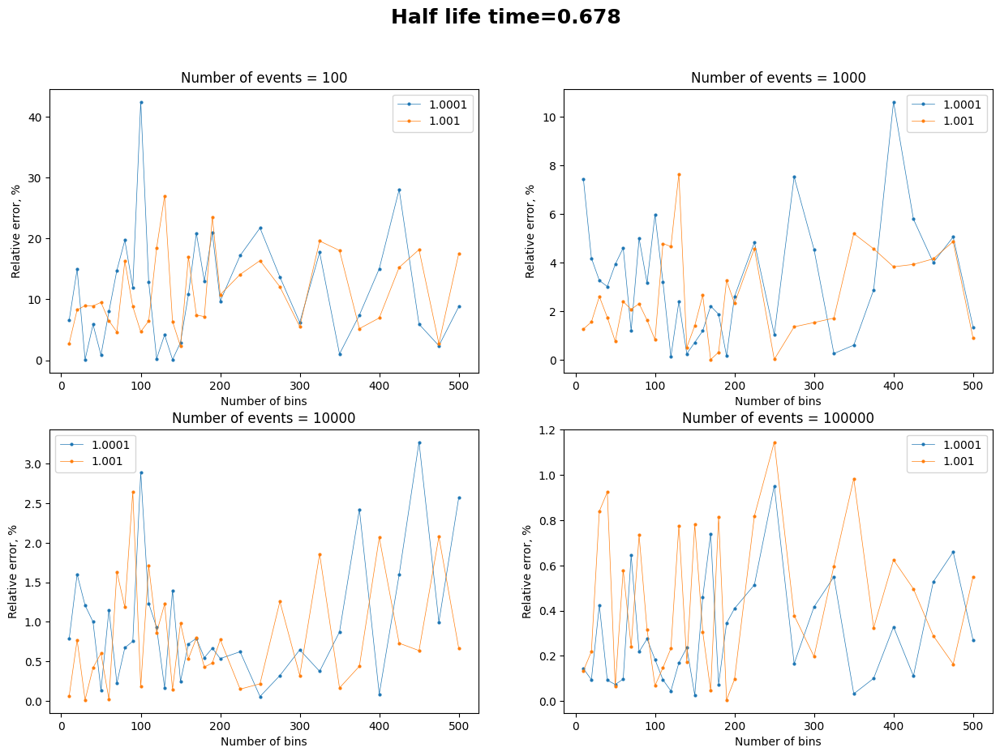

<Figure size 640x480 with 0 Axes>

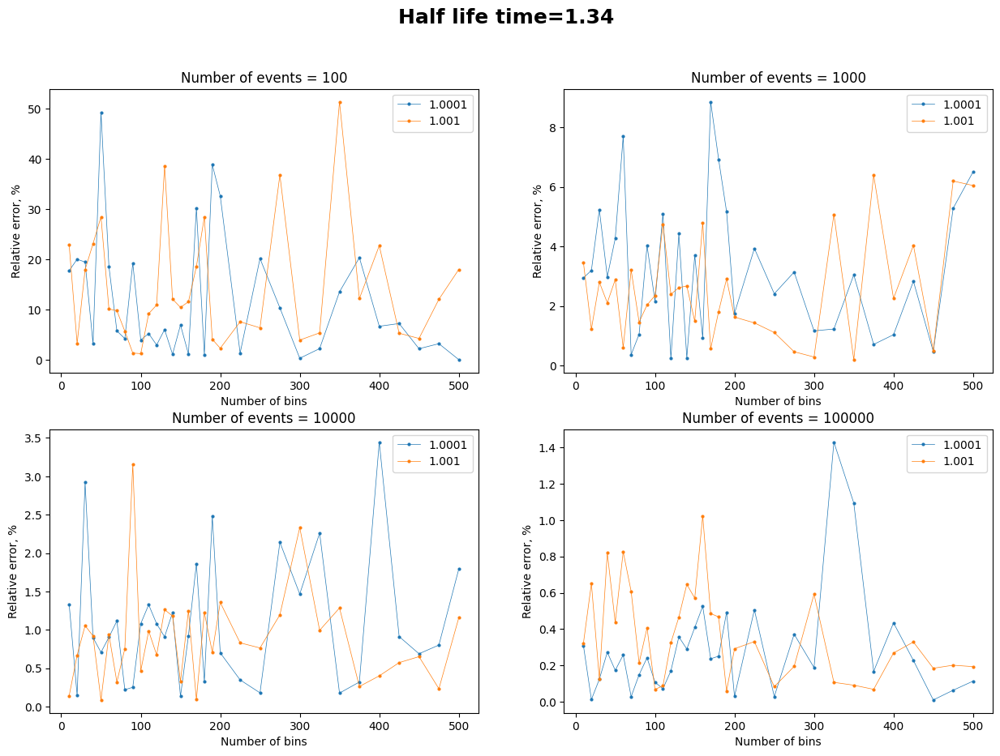

<Figure size 640x480 with 0 Axes>

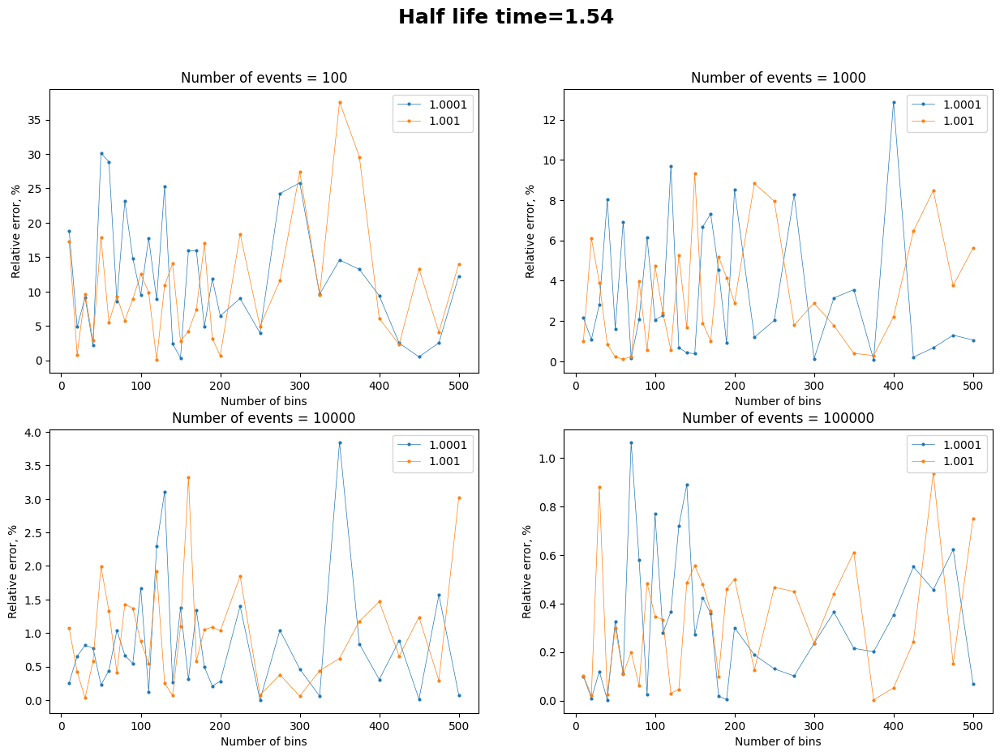

<Figure size 640x480 with 0 Axes>

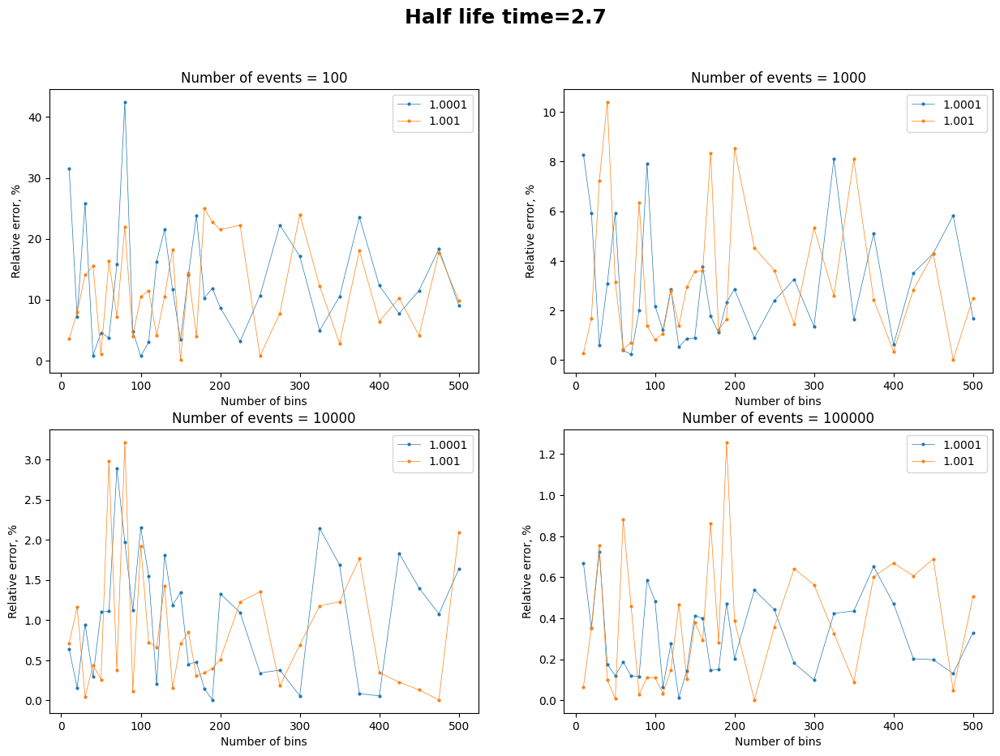

<Figure size 640x480 with 0 Axes>

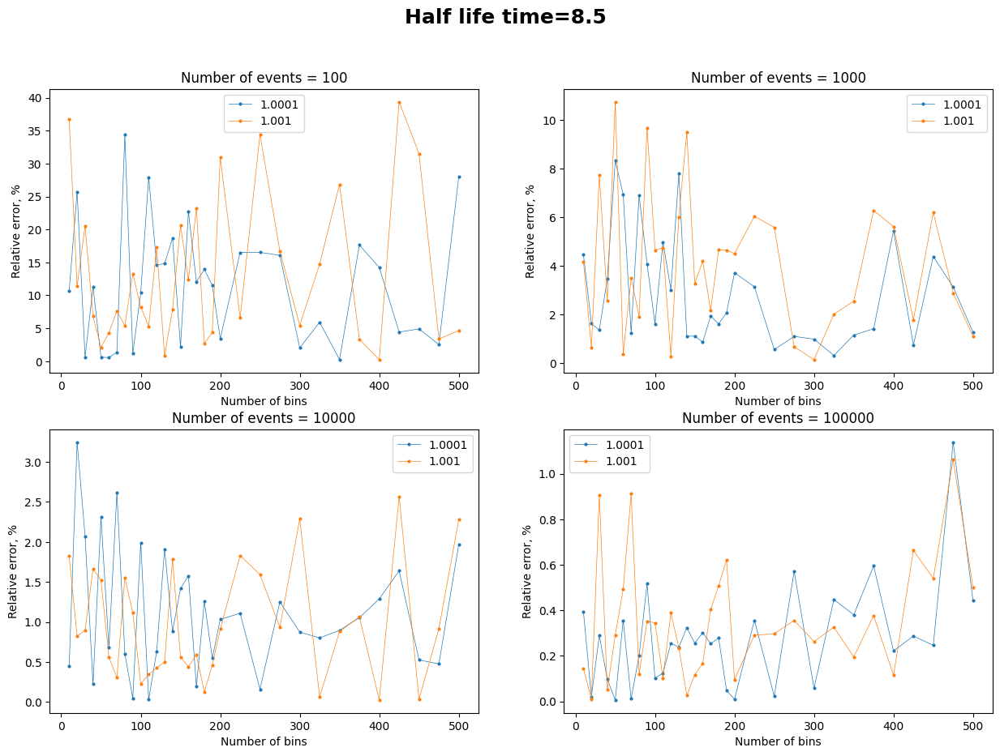

<Figure size 640x480 with 0 Axes>

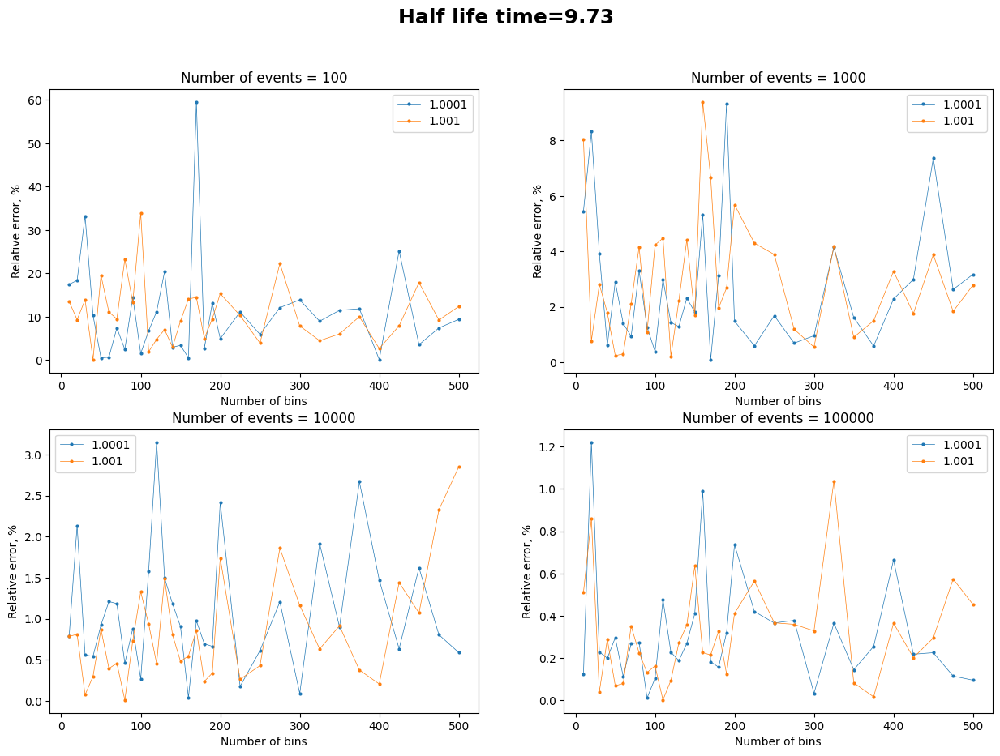

<Figure size 640x480 with 0 Axes>

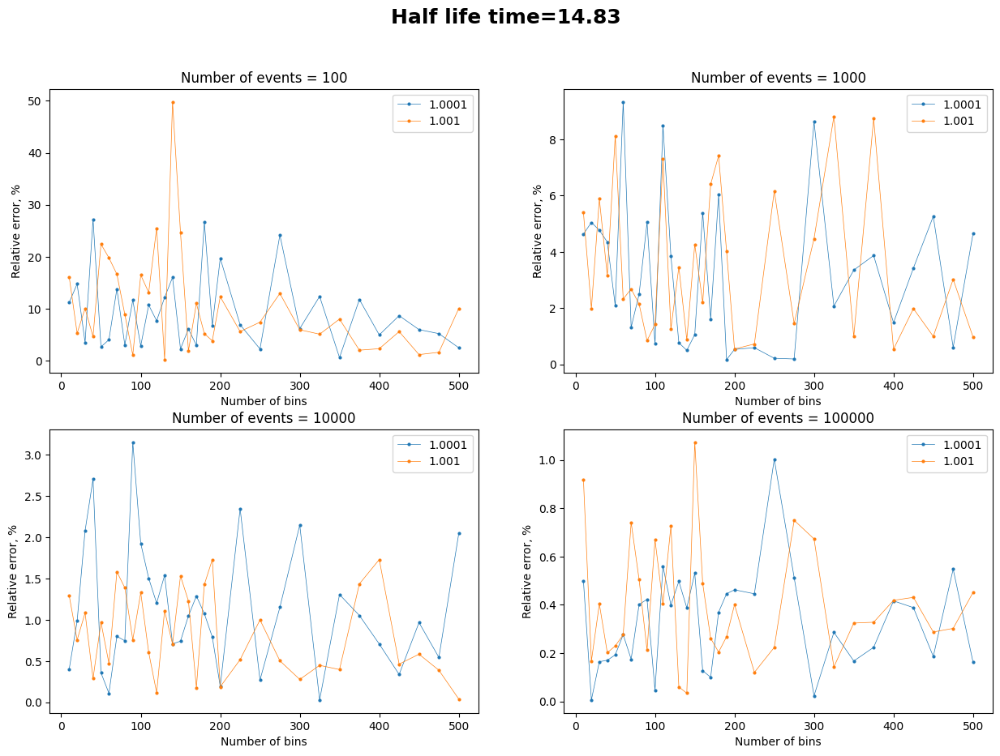

<Figure size 640x480 with 0 Axes>

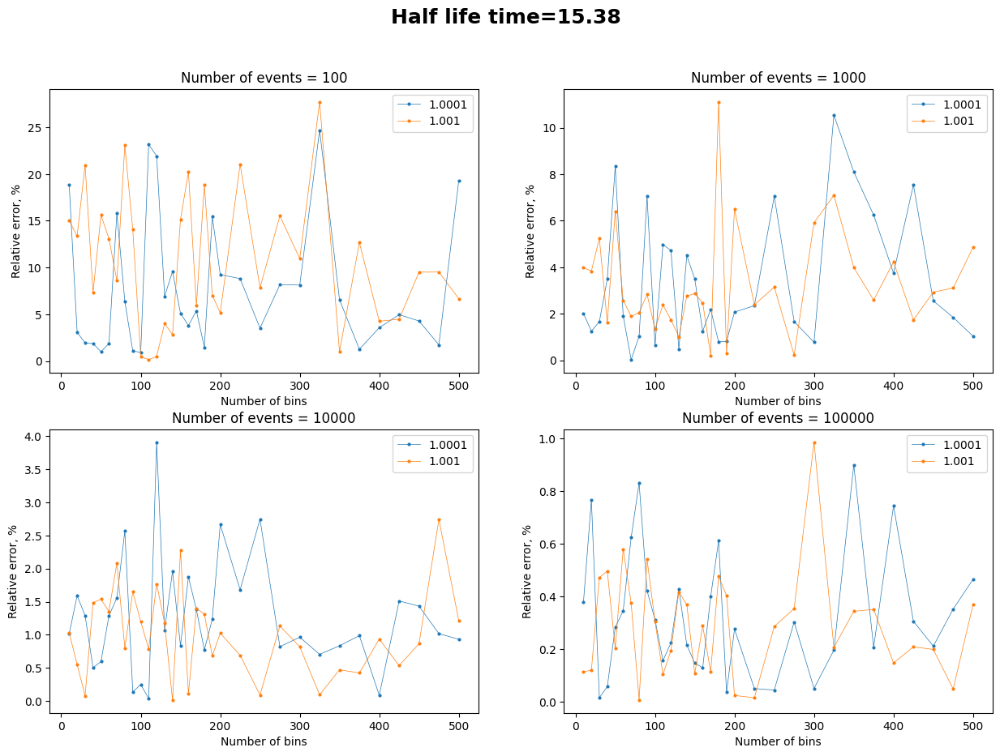

<Figure size 640x480 with 0 Axes>

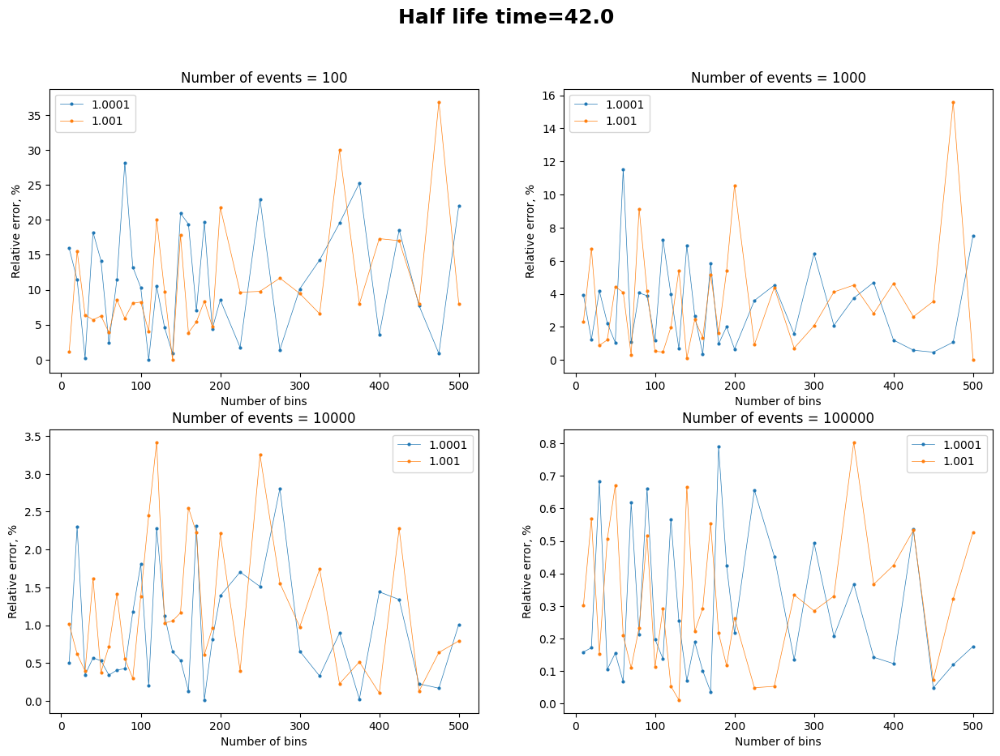

<Figure size 640x480 with 0 Axes>

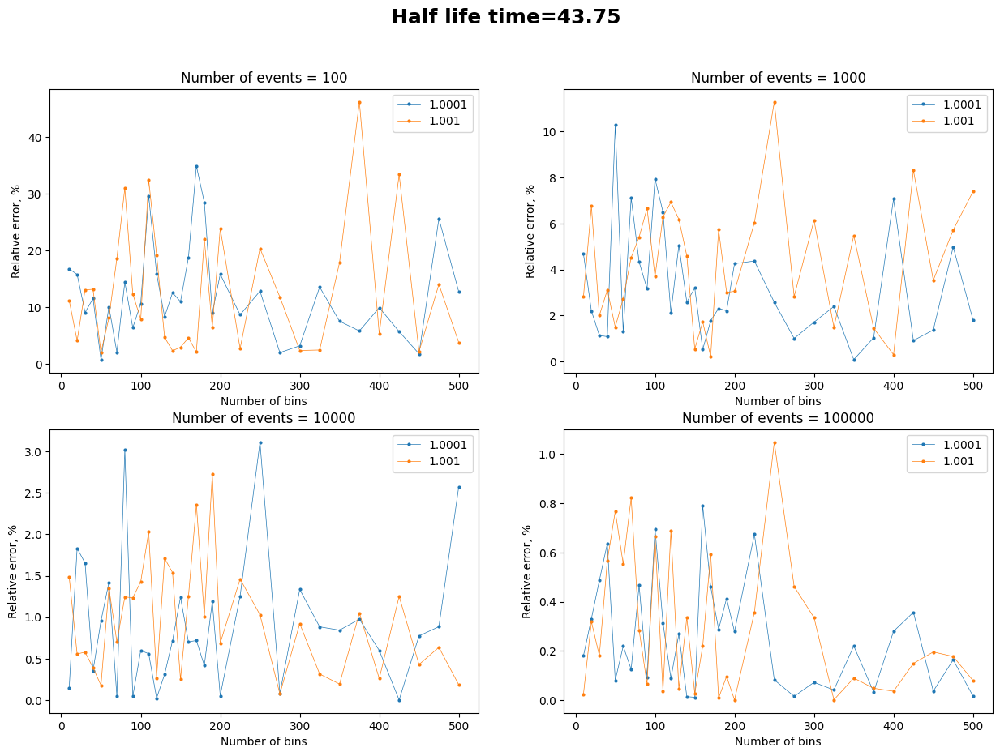

<Figure size 640x480 with 0 Axes>

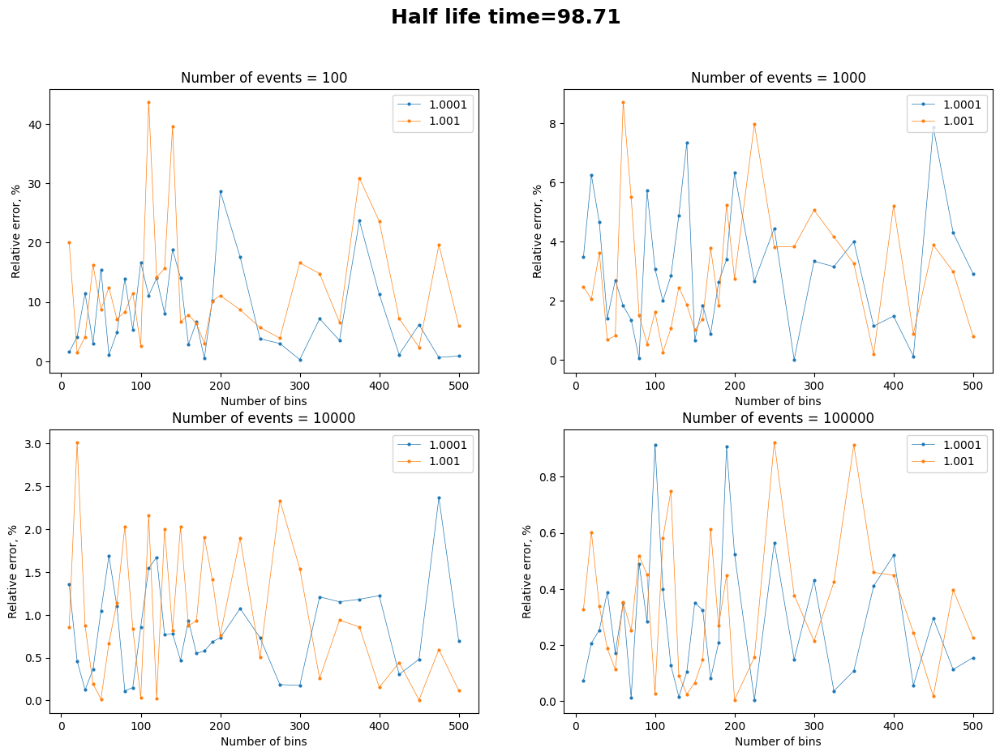

<Figure size 640x480 with 0 Axes>

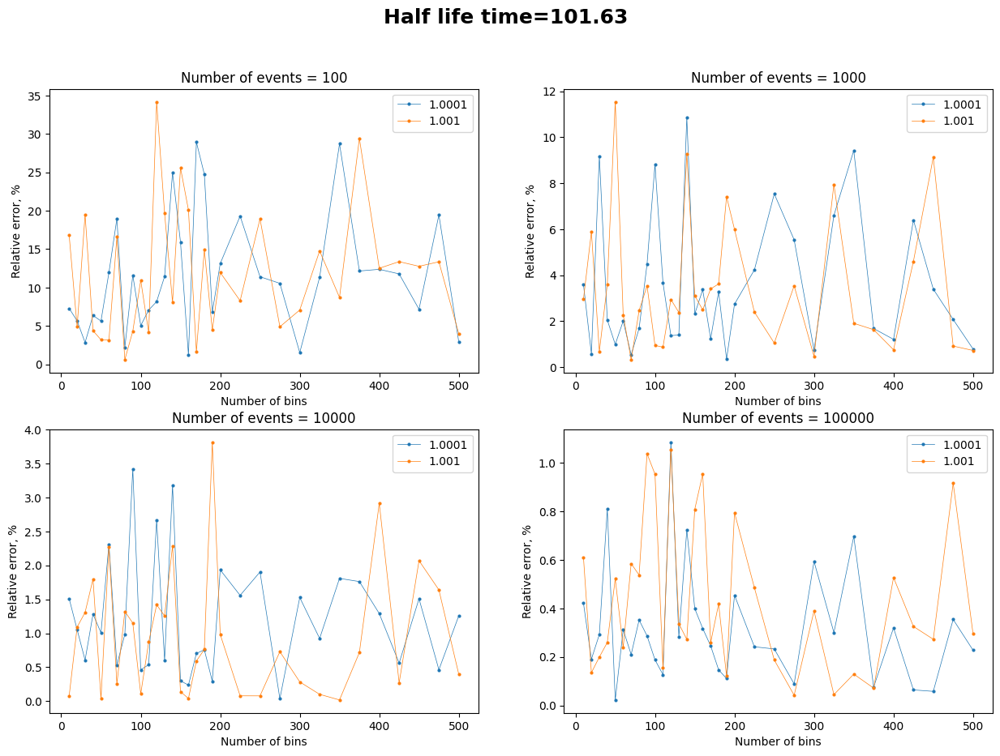

<Figure size 640x480 with 0 Axes>

In [ ]:
df = df[(df.a != 1.1) & (df.a != 1.01)]

for hlt in df.hlt.unique():
  df_1 = df[(df.hlt == hlt)].copy()
  fig, ax = plt.subplots(2, 2, figsize=(15,10))
  for n_d in df_1.num_of_decays.unique():
    ind = list(df_1.num_of_decays.unique()).index(n_d)
    ind = ((0, ind) if ind < 2 else (1, ind - 2))
    for a_tmp in df_1.a.unique():
      ax[ind].plot(df_1[(df_1.num_of_decays == n_d) & (df_1.a == a_tmp)].n_bins, df_1[(df_1.num_of_decays == n_d) & (df_1.a == a_tmp)].delta_hlt, '-o', label=str(a_tmp), linewidth=0.5, ms=2)
      ax[ind].legend()
      ax[ind].set_title(f'Number of events = {int(n_d)}')
      ax[ind].set_xlabel('Number of bins')
      ax[ind].set_ylabel('Relative error, %')
  fig.suptitle(f'Half life time={hlt}', fontweight="bold", fontsize=18)
  plt.show()
  plt.clf()

<ipython-input-8-1d90fd59bebc>:6: RuntimeWarning: overflow encountered in exp
  return a0 * (np.exp(-(t_0 * np.power(a, n) / tau)) - np.exp(-(t_0 * np.power(a, n + 1) / tau)))
<ipython-input-8-1d90fd59bebc>:6: RuntimeWarning: invalid value encountered in subtract
  return a0 * (np.exp(-(t_0 * np.power(a, n) / tau)) - np.exp(-(t_0 * np.power(a, n + 1) / tau)))
<ipython-input-8-1d90fd59bebc>:6: RuntimeWarning: overflow encountered in multiply
  return a0 * (np.exp(-(t_0 * np.power(a, n) / tau)) - np.exp(-(t_0 * np.power(a, n + 1) / tau)))
<ipython-input-8-1d90fd59bebc>:6: RuntimeWarning: overflow encountered in multiply
  return a0 * (np.exp(-(t_0 * np.power(a, n) / tau)) - np.exp(-(t_0 * np.power(a, n + 1) / tau)))
<ipython-input-8-1d90fd59bebc>:6: RuntimeWarning: overflow encountered in exp
  return a0 * (np.exp(-(t_0 * np.power(a, n) / tau)) - np.exp(-(t_0 * np.power(a, n + 1) / tau)))
<ipython-input-8-1d90fd59bebc>:6: RuntimeWarning: invalid value encountered in subtract
  return a0 

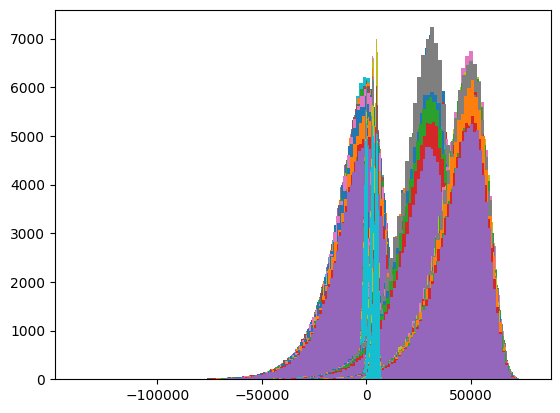

In [ ]:
# half_life_time_list =  [0.678, 2.7, 15.38, 43.75, 101.63]
# n_decays_list = [100, 1000, 10000, 100000]
half_life_time_list =  [0.678, 15.38, 101.63]
n_decays_list = [1000, 10000, 100000]

results_df_2 = pd.DataFrame(columns=['hlt', 'num_of_decays', 'a', 'n_bins', 'obtained_hlt', 'hlt_error'])
for half_life_time in half_life_time_list:
    for n_decays in n_decays_list:
        for a in [1.0001, 1.001]:
            for n_b in list(range(4, 501, 4)):
                fitting_results = full_cycle(n_decays, a, n_b, half_life_time)
                # if half_life_time > results[0] - results[1] and half_life_time < results[0] + results[1]:
                #     print(a, n_b, results)
                results_df_2.loc[len(results_df_2.index)] = [half_life_time, n_decays, a, n_b, fitting_results[0], fitting_results[1]]

results_df_2['delta_hlt'] = 100 * np.abs(results_df_2.obtained_hlt - results_df_2.hlt) / results_df_2.hlt

results_df_2.to_csv('data_for_parameters_fitting_3.csv')

# I decided to try to decribe dependencies as an seventh degree polynomial (actually, it does not play any role because this dependencies are not crucial).
Not all of combinations are shown, but there are no signofocant difference.

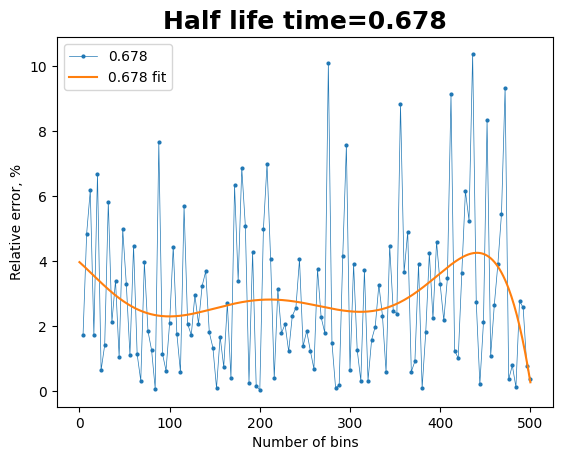

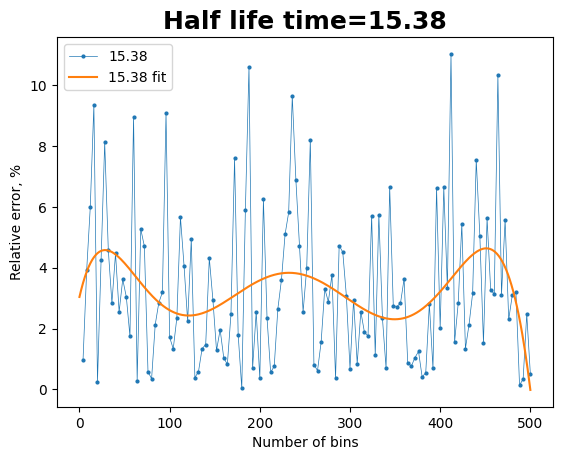

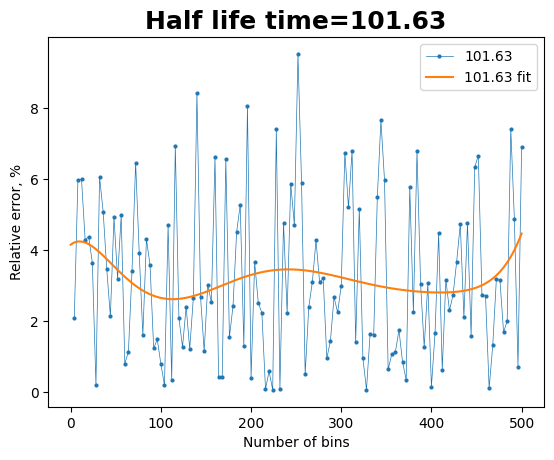

<Figure size 640x480 with 0 Axes>

In [ ]:
a_tmp = 1.001
for hlt in results_df_2.hlt.unique():
  df_1 = results_df_2[(results_df_2.hlt == hlt) & (results_df_2.a == a_tmp) & (results_df_2.num_of_decays == 1000)].copy()
  plt.plot(df_1.n_bins, df_1.delta_hlt, '-o', label=str(hlt), linewidth=0.5, ms=2)

  def rel_err_fit_func(n_b, *pars):
    result = 0
    for i in range(8):
      result += pars[i] * np.power(n_b, i)
    return result

  popt, pcov = curve_fit(rel_err_fit_func, df_1.n_bins, df_1.delta_hlt, p0=[1 for _ in range(8)])

  n_list = list(range(501))
  plt.plot(n_list, [rel_err_fit_func(n, *popt) for n in n_list], label=str(hlt) + ' fit')

  plt.legend()
  # plt.title(f'Number of events = {int(n_d)}')
  plt.xlabel('Number of bins')
  plt.ylabel('Relative error, %')
  plt.title(f'Half life time={hlt}', fontweight="bold", fontsize=18)
  plt.show()
  plt.clf()

# **Conclusions**
# The only useful point we got from this analysis is that stochastic behaviour of decays nature appears in our results and the best way to deal with it is to average several points. That's why in my main approach I am going to fit the data, making histogram with the next number of bins [100, 150, 200, 250, 300],  and that avarage them afterwards.